# Telco: Customer Clustering & Churn Prediction

The telecommunications company Telco finds itself facing a pressing challenge – a significant 26% of its customer base has opted to discontinue services in the last month. Recognising the critical need to address this surge in customer churn, Telco has decided to leverage data science in understanding and mitigating this trend.

Telco provided a data set with the following information:

* Customers who left within the last month 
* Services that each customer has signed up for
* Customer account information: How long they have been a customer, contract, payment method, paperless billing, monthly charges, and total charges
* Demographic info: Gender, age range, and if customers have partners and dependents

The mission is clear: develop predictive models to understand which customers are more likely to switch to competitors and what factors contribute to it. This data-driven approach will empower Telco to make informed decisions, implement targeted strategies, and proactively engage with customers to address their concerns and increase customer satisfaction.

The contributions of the customer churn prediction models will play a pivotal role in not only reshaping Telco's customer retention strategies but also building a more resilient and customer-centric telecommunications ecosystem.

Let's start with the analysis!

### Import libraries and data

In [1]:
# Data manipulation and analysis
import pandas as pd
import numpy as np

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Specify the path to your Excel file
csv_file_path = 'Telco-Customer-Churn.csv'

# Read the Excel file into a pandas DataFrame
telco_df = pd.read_csv(csv_file_path)

### Exploratory Data Analysis (EDA)

In [3]:
# DIMENSIONS

In [4]:
# Check the dimensions of the dataset
telco_df.shape

(7043, 21)

In [5]:
# Display the first few rows of the DataFrame to inspect the data
telco_df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [6]:
# DATA TYPES

In [7]:
telco_df.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                object
dtype: object

In [8]:
# Convert to 'category' data type
columns_to_convert = ['gender','SeniorCitizen','Partner','Dependents','PhoneService','MultipleLines','InternetService',
'OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies','Contract','PaperlessBilling',
'PaymentMethod','Churn']

telco_df[columns_to_convert] = telco_df[columns_to_convert].astype('category')

# Convert to 'numeric' data type, handling errors by coercing non-numeric values to NaN
numeric_to_convert = 'TotalCharges'
telco_df[numeric_to_convert] = pd.to_numeric(telco_df[numeric_to_convert], errors='coerce')

# Display the data types after conversion
print(telco_df.dtypes)

customerID            object
gender              category
SeniorCitizen       category
Partner             category
Dependents          category
tenure                 int64
PhoneService        category
MultipleLines       category
InternetService     category
OnlineSecurity      category
OnlineBackup        category
DeviceProtection    category
TechSupport         category
StreamingTV         category
StreamingMovies     category
Contract            category
PaperlessBilling    category
PaymentMethod       category
MonthlyCharges       float64
TotalCharges         float64
Churn               category
dtype: object


In [9]:
# MISSING VALUES

In [10]:
# Display the count of missing values for each column
missing_values = telco_df.isnull().sum()
print("Missing Values for Each Column:")
print(missing_values)

Missing Values for Each Column:
customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64


We will drop the 11 obervations with missing values since their representation is very small compared to the total dataset and removing them won't impact our analysis.

In [11]:
telco_df = telco_df.dropna(subset=['TotalCharges'])

In [12]:
missing_values = telco_df['TotalCharges'].isnull().sum()
print("Missing Values for TotalCharges:")
print(missing_values)

Missing Values for TotalCharges:
0


In [13]:
# DUPLICATED DATA

In [14]:
# Display the rows that are duplicated
duplicated_data = telco_df.duplicated()
duplicated_rows = telco_df[duplicated_data]
print("Duplicated Rows:")
print(duplicated_rows)

Duplicated Rows:
Empty DataFrame
Columns: [customerID, gender, SeniorCitizen, Partner, Dependents, tenure, PhoneService, MultipleLines, InternetService, OnlineSecurity, OnlineBackup, DeviceProtection, TechSupport, StreamingTV, StreamingMovies, Contract, PaperlessBilling, PaymentMethod, MonthlyCharges, TotalCharges, Churn]
Index: []

[0 rows x 21 columns]


In [15]:
# Duplicated Customers

duplicated_customers = telco_df.duplicated(subset=['customerID'])
duplicated_rows_customers = telco_df[duplicated_customers]
print("Duplicated Rows Based on Subset of Columns:")
print(duplicated_rows_customers)

Duplicated Rows Based on Subset of Columns:
Empty DataFrame
Columns: [customerID, gender, SeniorCitizen, Partner, Dependents, tenure, PhoneService, MultipleLines, InternetService, OnlineSecurity, OnlineBackup, DeviceProtection, TechSupport, StreamingTV, StreamingMovies, Contract, PaperlessBilling, PaymentMethod, MonthlyCharges, TotalCharges, Churn]
Index: []

[0 rows x 21 columns]


In [16]:
# CATEGORICAL FEATURES 

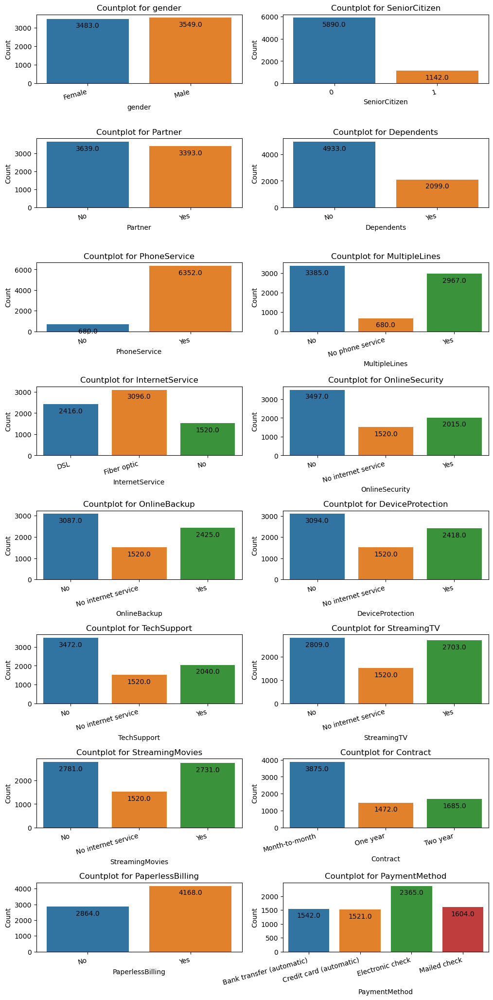

In [17]:
categorical_columns = ['gender','SeniorCitizen','Partner','Dependents','PhoneService','MultipleLines','InternetService',
'OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies','Contract','PaperlessBilling',
'PaymentMethod','Churn']

# Set up subplots for bar plots
fig, axes = plt.subplots(nrows=len(categorical_columns) // 2, ncols=2, figsize=(12, 25))
fig.subplots_adjust(hspace=0.8)

# Create bar plots for each categorical variable
for col, ax in zip(categorical_columns, axes.flatten()):
    sns.countplot(x=col, data=telco_df, ax=ax)
    ax.set_title(f'Countplot for {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Count')

    # Rotate x-axis labels
    ax.set_xticklabels(ax.get_xticklabels(), rotation=15, ha='right')

    # Annotate bars with count numbers below the top of the bar
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}',
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, -10), textcoords='offset points')

plt.show()

The following customer features seem to be linked with higher churn:

- Senior Citisens
- Singles
- Without dependents
- Fiber Optic services
- Without online security
- Without online backup
- Without device protection
- Without tech support
- Month to month contract
- Paperless billing
- Electronic check payment method

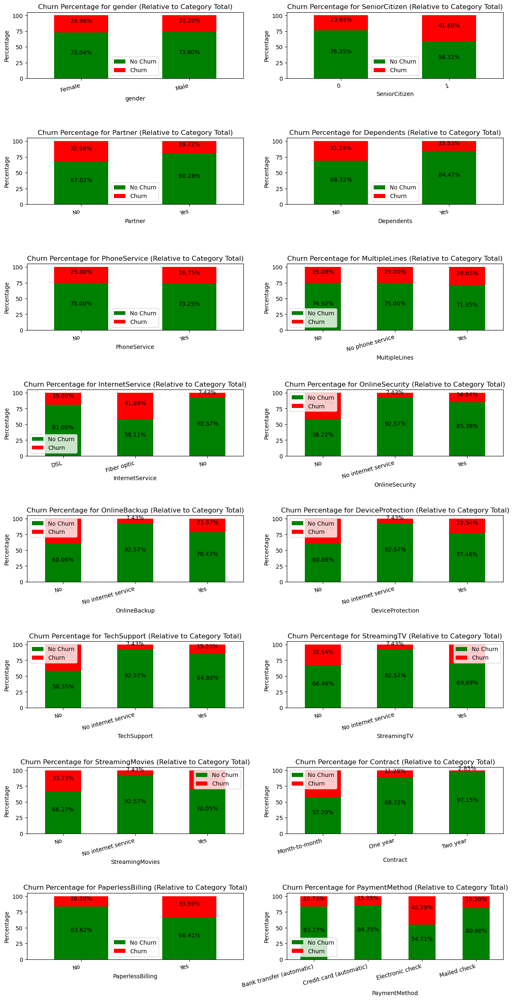

In [18]:
# Set up subplots for stacked bar charts
fig, axes = plt.subplots(nrows=len(categorical_columns) // 2, ncols=2, figsize=(15, 30))
fig.subplots_adjust(hspace=0.9)

# Create stacked bar charts for each categorical variable against Churn
for col, ax in zip(categorical_columns, axes.flatten()):
    # Calculate percentages relative to the total within each category
    percentages = telco_df.groupby([col, 'Churn']).size().unstack(fill_value=0)
    percentages = percentages.div(percentages.sum(axis=1), axis=0) * 100

    # Plot the stacked bar chart
    percentages.plot(kind='bar', stacked=True, color=['green', 'red'], ax=ax)
    
    ax.set_title(f'Churn Percentage for {col} (Relative to Category Total)')
    ax.set_xlabel(col)
    ax.set_ylabel('Percentage')

    # Rotate x-axis labels 
    ax.set_xticklabels(ax.get_xticklabels(), rotation=15, ha='right')

    ax.legend(['No Churn', 'Churn'])
    
    # Annotate bars with percentage values
    for p in ax.patches:
        height = p.get_height()
        width = p.get_width()
        x, y = p.get_xy() 
        # Ensure percentage labels are not placed on small bars
        if height > 1:
            ax.annotate(f'{height:.2f}%',
                        (x + width / 2., y + height / 2.),
                        ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.show()

In [19]:
# NUMERICAL FEATURES - DESCRIPTIVE STATISTICS

In [20]:
telco_df.describe()

,tenure,MonthlyCharges,TotalCharges
count,7032.000000,7032.000000,7032.000000
mean,32.421786,64.798208,2283.300441
std,24.545260,30.085974,2266.771362
min,1.000000,18.250000,18.800000
25%,9.000000,35.587500,401.450000
50%,29.000000,70.350000,1397.475000
75%,55.000000,89.862500,3794.737500
max,72.000000,118.750000,8684.800000


In [21]:
# NUMERICAL FEATURES - DISTRIBUTIONS

In [22]:
telco_df.groupby(['InternetService'])['MonthlyCharges'].mean()

InternetService
DSL            58.088017
Fiber optic    91.500129
No             21.076283
Name: MonthlyCharges, dtype: float64

The distribution of the tenure feature exhibits a U-shape, indicating that customers tend to have either very short or very long tenures, with fewer in the middle range. 

The presence of multiple peaks in the monthly charges distribution indicates that there are distinct subgroups within the data with different service plans, as shown in thhe table above.

A positively skewed histogram for the "Total Charges" variable indicates that the majority of the values are concentrated on the left side, with a long tail extending to the right. This might imply that the majority of customers have lower total charges, with a smaller number of customers contributing significantly to higher total charges.

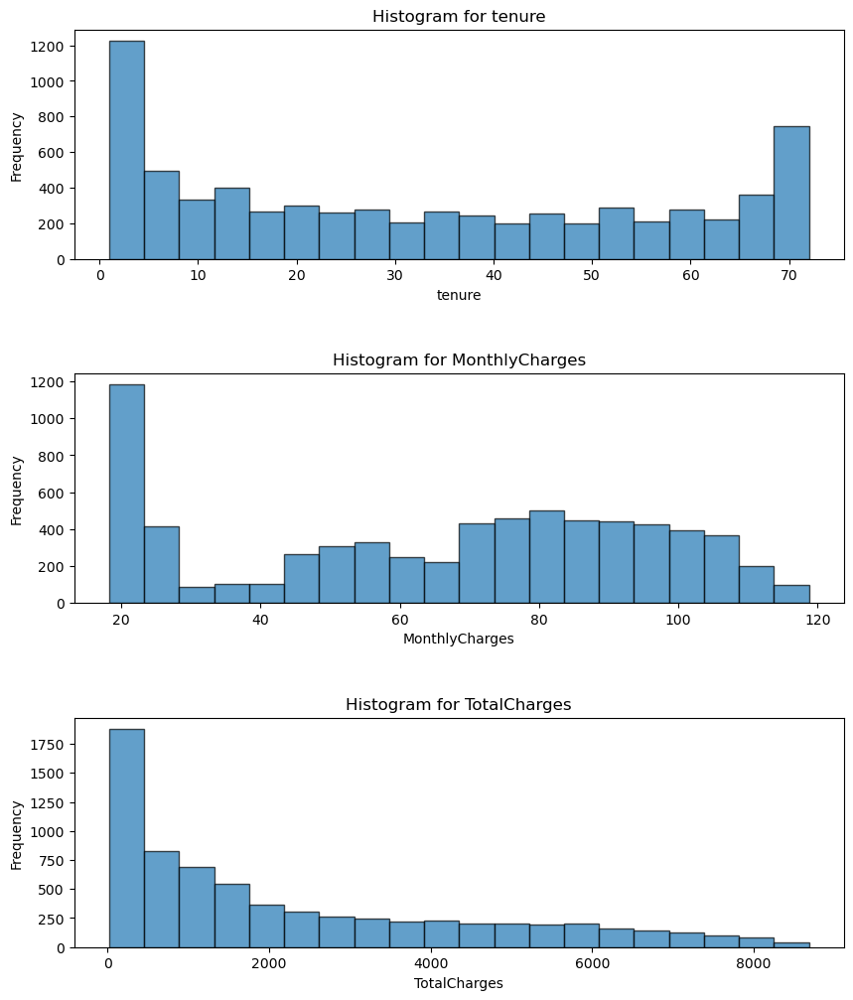

In [23]:
# Select numerical columns 
numerical_columns = ['tenure', 'MonthlyCharges', 'TotalCharges']

# Set up subplots
fig, axes = plt.subplots(nrows=len(numerical_columns), figsize=(10, 12))
fig.subplots_adjust(hspace=0.5)

# Create histograms for each numerical variable
for col, ax in zip(numerical_columns, axes):
    ax.hist(telco_df[col], bins=20, edgecolor='black', alpha=0.7)
    ax.set_title(f'Histogram for {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Frequency')

plt.show()

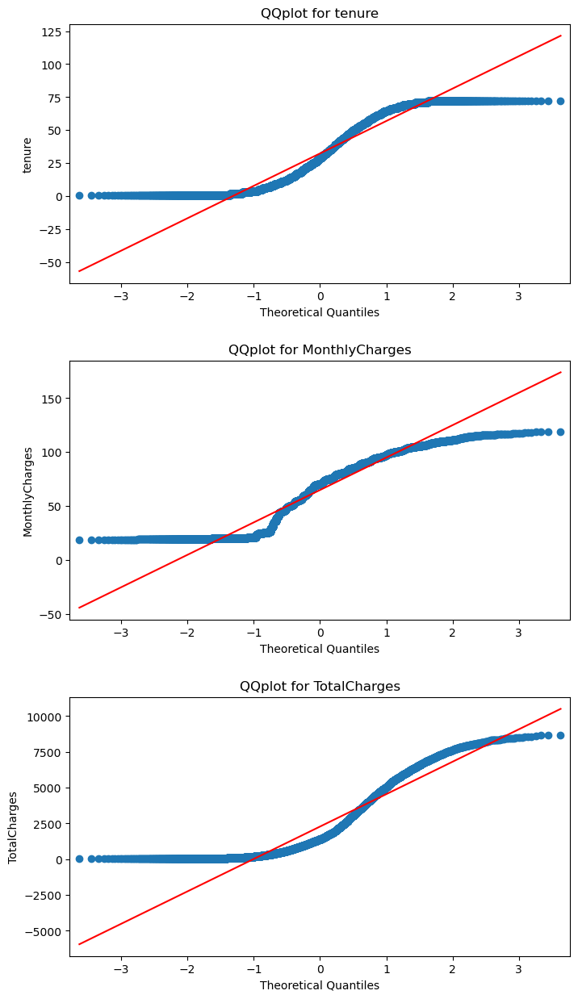

In [24]:
from statsmodels.graphics.gofplots import qqplot

# Set up subplots for violin plots
fig, axes = plt.subplots(nrows=len(numerical_columns), figsize=(8, 15))
fig.subplots_adjust(hspace=0.3)

# Create box plots for each numerical variable
for col, ax in zip(numerical_columns, axes):
    qqplot(telco_df[col], line='s', ax=ax)
    ax.set_title(f'QQplot for {col}')
    ax.set_ylabel(col)

plt.show()

In [25]:
# NUMERICAL FEATURES - PAIRPLOTS

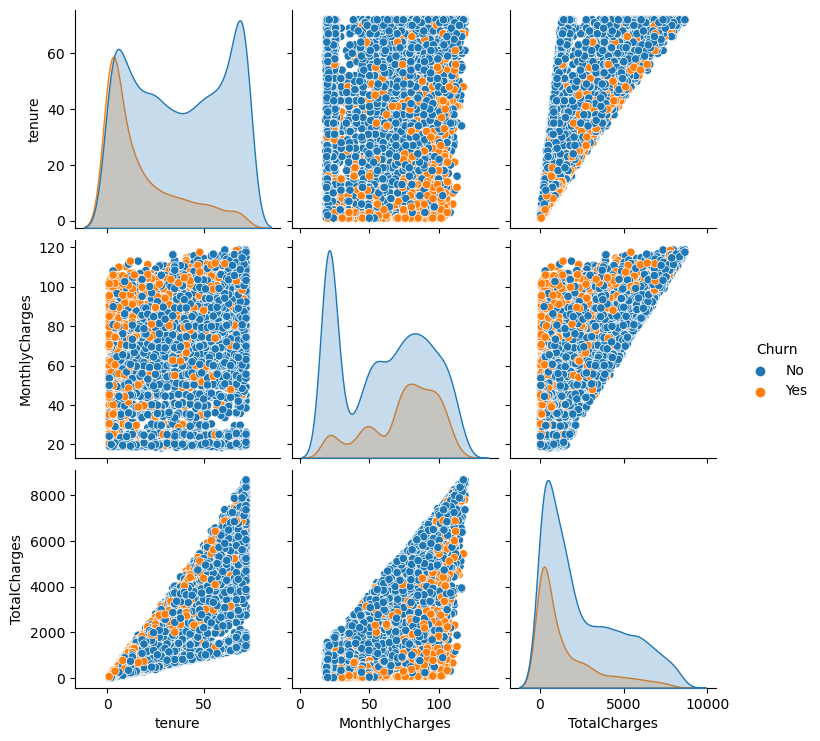

In [26]:
# Add the 'churn' column to the pairplot for color differentiation
pairplot_data = telco_df[numerical_columns + ['Churn']]

# Create a pairplot
sns.pairplot(pairplot_data, hue='Churn', diag_kind='kde')
plt.show()

In [27]:
# NUMERICAL FEATURES: VIOLIN PLOTS

TENURE:

Loyal customers exhibit a bimodal distribution in tenure, which might suggest the existence of two or more customer segments with different patterns of behavior or characteristics regarding their tenure with the company. 

Churned customers exhibit a positively skewed distribution in tenure, indicating that customers are more likely to churn earlier in their relationship with the company and highlighting the importance of early customer engagement and satisfaction to reduce churn.

MONTHLY CHARGES:

The presence of multimodal distributions for both loyal and churned customers indicates that there are distinct subgroups within the data potentially linked to service packages.

The multimodal distribution for churned members, with a high density at high monthly charges, indicates that a significant portion of churned customers had monthly charges of 70 USD or more, which are very likely to be related to the Fiber Optic service packages. There are two potential interpretations: Customers with Fiber Optic might perceive the value proposition as inadequate or they are not happy with their service quality, customer support, or contract terms.

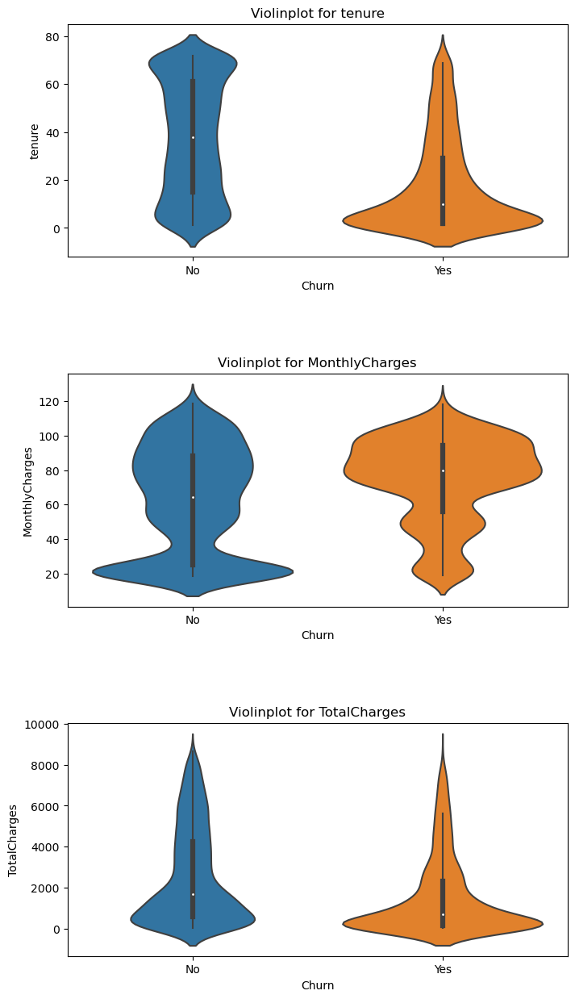

In [28]:
# Set up subplots for box plots
fig, axes = plt.subplots(nrows=len(numerical_columns), figsize=(8, 15))
fig.subplots_adjust(hspace=0.5)

# Create box plots for each numerical variable
for col, ax in zip(numerical_columns, axes):
    sns.violinplot(x='Churn', y=col, data=telco_df, ax=ax)
    ax.set_title(f'Violinplot for {col}')
    ax.set_xlabel('Churn')
    ax.set_ylabel(col)

plt.show()

In [29]:
# NUMERICAL FEATURES - CORRELATIONS

Churn_numeric and Tenure:

There is a negative correlation of approximately -0.35 between Churn and Tenure. This indicates that customers with longer tenure are less likely to churn.

Churn_numeric and MonthlyCharges:

There is a positive correlation of approximately 0.19 between Churn and MonthlyCharges. This suggests a weak positive relationship between monthly charges and churn, meaning that customers with higher monthly charges may be slightly more likely to churn. This could be related to the package services as pointed out before.

Churn_numeric and TotalCharges:

There is a negative correlation of approximately -0.20 between Churn and TotalCharges. This implies that customers with higher total charges are less likely to churn. There is a weak negative relationship between total charges and churn and migth be related with tenure.

C:\Users\alsan\AppData\Local\Temp\ipykernel_18508\653135171.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = telco_df.corr()


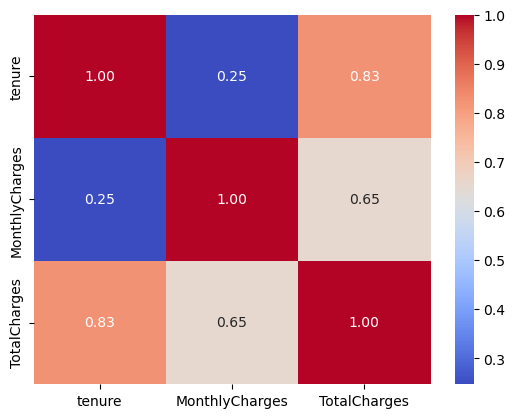

In [30]:
# Calculate correlation matrix
correlation_matrix = telco_df.corr()

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

In [31]:
# NUMERICAL FEATURES - OUTLIERS

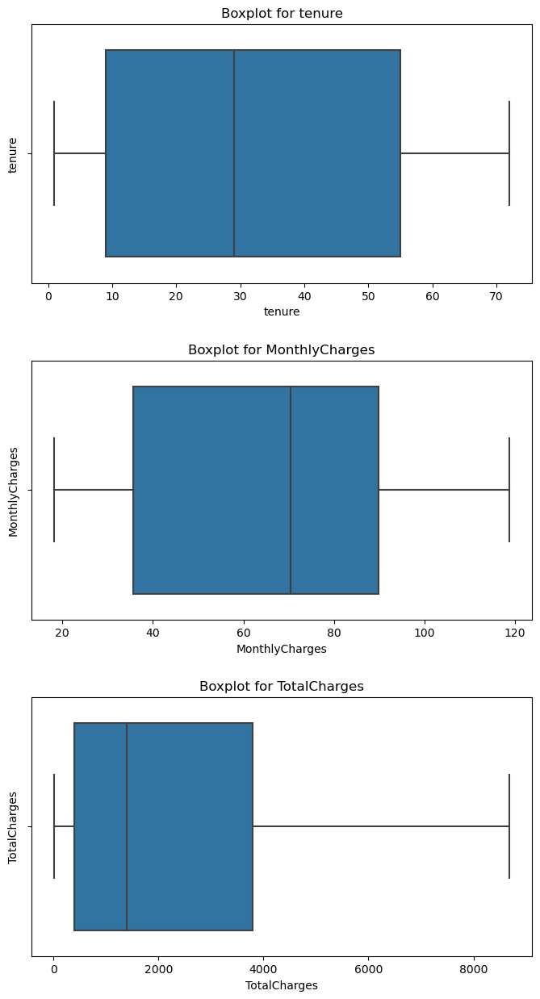

In [32]:
# Set up subplots for box plots
fig, axes = plt.subplots(nrows=len(numerical_columns), figsize=(8, 15))
fig.subplots_adjust(hspace=0.3)

# Create box plots for each numerical variable
for col, ax in zip(numerical_columns, axes):
    sns.boxplot(x=col, data=telco_df, ax=ax)
    ax.set_title(f'Boxplot for {col}')
    ax.set_ylabel(col)

plt.show()

We will use z-scores of 3 to identify data points that are approximately three standard deviations away from the mean as outliers. This is a relatively conservative approach to only consider extreme outliers.

In [33]:
from scipy.stats import zscore

# Calculate z-scores for numeric features
z_scores_tenure = zscore(telco_df['tenure'])
z_scores_monthly_charges = zscore(telco_df['MonthlyCharges'])
z_scores_total_charges = zscore(telco_df['TotalCharges'])

# Identify outliers based on z-scores
outliers_tenure = (z_scores_tenure > 3) | (z_scores_tenure < -3)
outliers_monthly_charges = (z_scores_monthly_charges > 3) | (z_scores_monthly_charges < -3)
outliers_total_charges = (z_scores_total_charges > 3) | (z_scores_total_charges < -3)

print('Tenure outliers:', len(telco_df[outliers_tenure]))
print('Monthly charges outliers:', len(telco_df[outliers_monthly_charges]))
print('Total charges outliers:', len(telco_df[outliers_total_charges]))

Tenure outliers: 0
Monthly charges outliers: 0
Total charges outliers: 0


In [34]:
# TENURE

In [35]:
# Calculate percentiles for all customers
percentiles_all = np.percentile(telco_df['tenure'], [10, 25, 50, 75, 90])
print(f"Percentiles for 'tenure' in all customers: {percentiles_all}")

Percentiles for 'tenure' in all customers: [ 2.  9. 29. 55. 69.]


In [36]:
# Calculate percentiles for churned customers
churned_customers = telco_df[telco_df['Churn']=='Yes']
percentiles_churned = np.percentile(churned_customers['tenure'], [10, 25, 50, 75, 90])
print(f"Percentiles for 'tenure' in churned customers: {percentiles_churned}")

Percentiles for 'tenure' in churned customers: [ 1.  2. 10. 29. 51.]


We can build some Tenure categories using the percentiles as a reference. This way we can analyse the churn rates for each segment. Having these segments might provide more interpretable results, especially if there are clear patterns or stages in customer behavior associated with different tenure categories. We will check later if having these categories adds any value to predict customer churn.

In [37]:
# Create conditions for each category
conditions = [
    (telco_df['tenure'] <= 2),
    (telco_df['tenure'] > 2) & (telco_df['tenure'] <= 12),
    (telco_df['tenure'] > 12) & (telco_df['tenure'] <= 30),
    (telco_df['tenure'] > 30) & (telco_df['tenure'] <= 48),
    (telco_df['tenure'] > 48)
]

# Assign labels for each category
categories = ["New Customers", "Early-stage Customers", "Mid-stage Customers", "Established Customers", "Long-term Customers"]

# Create a new column 'Tenure_Category' based on the specified conditions and labels
telco_df.loc[:, 'Tenure_Category'] = np.select(conditions, categories, default='Unknown')

[Text(0, 0, 'New Customers'),
 Text(1, 0, 'Early-stage Customers'),
 Text(2, 0, 'Mid-stage Customers'),
 Text(3, 0, 'Established Customers'),
 Text(4, 0, 'Long-term Customers')]

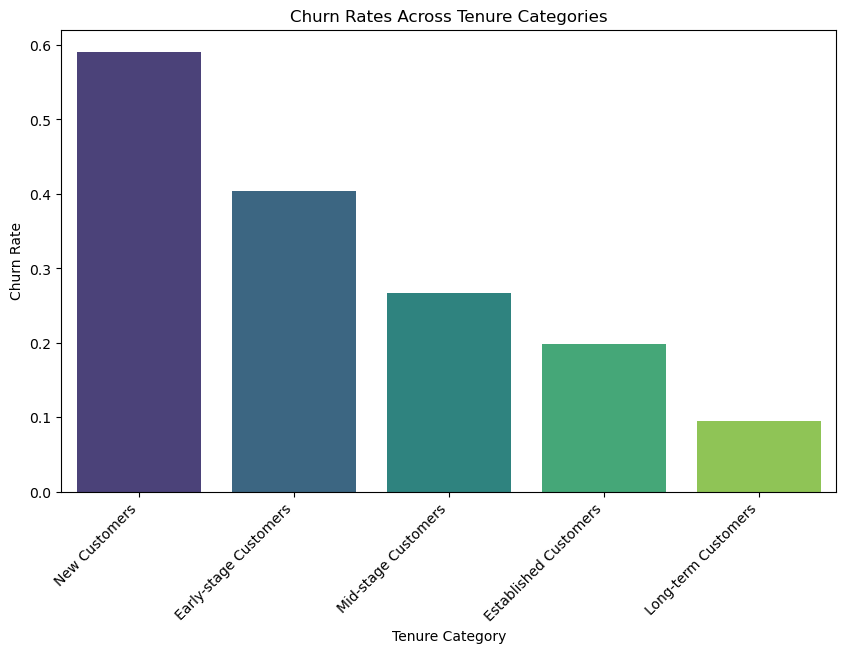

In [38]:
# Convert 'Churn' to numeric representation
telco_df['Churn_numeric'] = telco_df['Churn'].map({'Yes': 1, 'No': 0})

# Convert to 'numeric' data type, handling errors by coercing non-numeric values to NaN
churn_to_convert = 'Churn_numeric'
telco_df[churn_to_convert] = pd.to_numeric(telco_df[churn_to_convert], errors='coerce')

# Calculate churn rates for each tenure category
churn_rates = telco_df.groupby('Tenure_Category')['Churn_numeric'].mean().reset_index()

# Define the desired order of bars
desired_order = ["New Customers", "Early-stage Customers", "Mid-stage Customers", "Established Customers", "Long-term Customers"]

# Set up the plot with the desired order
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Tenure_Category', y='Churn_numeric', data=churn_rates, palette='viridis', order=desired_order)
plt.title('Churn Rates Across Tenure Categories')
plt.xlabel('Tenure Category')
plt.ylabel('Churn Rate')

# Rotate x-axis labels
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

In [39]:
# SERVICE PACKAGES

In [40]:
# List of all service-related columns (both multiple categories and binary)
service_columns = ['PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
                   'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod']

# Create a new column that concatenates the values of the relevant service columns for each row
telco_df['ServiceCombination'] = telco_df[service_columns].astype(str).agg('-'.join, axis=1)

# Count the number of customers for each combination of services
service_combination_counts = telco_df['ServiceCombination'].value_counts().reset_index()
service_combination_counts.columns = ['ServiceCombination', 'CustomerCount']

# Calculate the average monthly charges for each combination of services
avg_monthly_charges = telco_df.groupby('ServiceCombination')['MonthlyCharges'].mean().reset_index()
avg_monthly_charges.columns = ['ServiceCombination', 'AvgMonthlyCharges']

# Calculate the percentage of churn for each combination of services
churn_percentage = telco_df.groupby('ServiceCombination')['Churn_numeric'].mean().reset_index()
churn_percentage.columns = ['ServiceCombination', 'ChurnPercentage']

# Merge the DataFrames
result_df = pd.merge(service_combination_counts, avg_monthly_charges, on='ServiceCombination')
result_df = pd.merge(result_df, churn_percentage, on='ServiceCombination')

# Add total of lost costumers
result_df['Lost_customers'] = result_df['CustomerCount'] * result_df['ChurnPercentage']

# Display the counts
pd.set_option('display.max_colwidth', None)
result_df_sorted = result_df.sort_values(by='Lost_customers', ascending=False)
result_df_sorted.query('Lost_customers>10')

,ServiceCombination,CustomerCount,AvgMonthlyCharges,ChurnPercentage,Lost_customers
3,Yes-No-Fiber optic-No-No-No-No-No-No-Month-to-month-Yes-Electronic check,110,69.983182,0.681818,75.0
6,Yes-Yes-Fiber optic-No-No-No-No-No-No-Month-to-month-Yes-Electronic check,84,75.037500,0.666667,56.0
8,Yes-Yes-Fiber optic-No-No-No-No-Yes-Yes-Month-to-month-Yes-Electronic check,70,94.828571,0.728571,51.0
0,Yes-No-No-No internet service-No internet service-No internet service-No internet service-No internet service-No internet service-Month-to-month-No-Mailed check,217,19.985945,0.188940,41.0
12,Yes-Yes-Fiber optic-No-No-Yes-No-Yes-Yes-Month-to-month-Yes-Electronic check,47,100.081915,0.787234,37.0
14,Yes-Yes-Fiber optic-No-No-No-No-No-Yes-Month-to-month-Yes-Electronic check,46,84.935870,0.804348,37.0
20,Yes-No-Fiber optic-No-No-No-No-Yes-No-Month-to-month-Yes-Electronic check,38,79.951316,0.815789,31.0
11,Yes-Yes-Fiber optic-No-Yes-Yes-No-Yes-Yes-Month-to-month-Yes-Electronic check,48,104.805208,0.625000,30.0
23,Yes-Yes-Fiber optic-No-Yes-No-No-Yes-Yes-Month-to-month-Yes-Electronic check,36,100.097222,0.722222,26.0
22,Yes-No-Fiber optic-No-No-No-No-Yes-Yes-Month-to-month-Yes-Electronic check,37,90.171622,0.675676,25.0


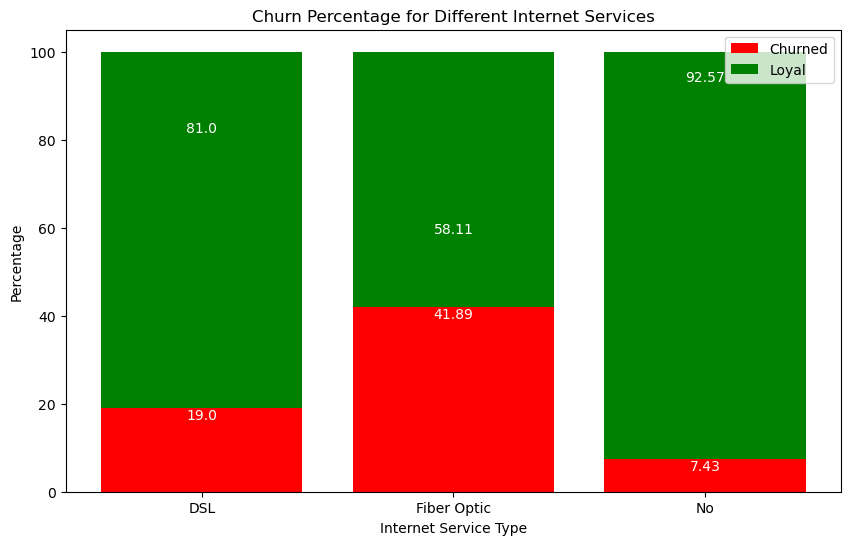

In [41]:
# Filter data for each internet service type
dsl_data = telco_df[telco_df['InternetService'] == 'DSL']
fiber_optic_data = telco_df[telco_df['InternetService'] == 'Fiber optic']
other_data = telco_df[telco_df['InternetService'] == 'No']

# Calculate churn percentages for each service type
dsl_churn_percentage = dsl_data['Churn_numeric'].mean() * 100
fiber_optic_churn_percentage = fiber_optic_data['Churn_numeric'].mean() * 100
no_churn_percentage = other_data['Churn_numeric'].mean() * 100

# Data for plotting
services = ['DSL', 'Fiber Optic', 'No']
churn_percentages = [dsl_churn_percentage, fiber_optic_churn_percentage, no_churn_percentage]
loyal_percentages = [100 - percentage for percentage in churn_percentages]

# Plotting the stacked bar chart
plt.figure(figsize=(10, 6))
bottom_bar = plt.bar(services, churn_percentages, color='red', label='Churned')
top_bar = plt.bar(services, loyal_percentages, color='green', bottom=churn_percentages, label='Loyal')

# Add labels and title
plt.xlabel('Internet Service Type')
plt.ylabel('Percentage')
plt.title('Churn Percentage for Different Internet Services')
plt.legend()

# Display the percentages on top of the bars
for bar in bottom_bar + top_bar:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='top' if bar.get_height() < 50 else 'bottom', color='white')

# Show the plot
plt.show()

In [42]:
telco_df.groupby('InternetService')['MonthlyCharges'].mean()

InternetService
DSL            58.088017
Fiber optic    91.500129
No             21.076283
Name: MonthlyCharges, dtype: float64

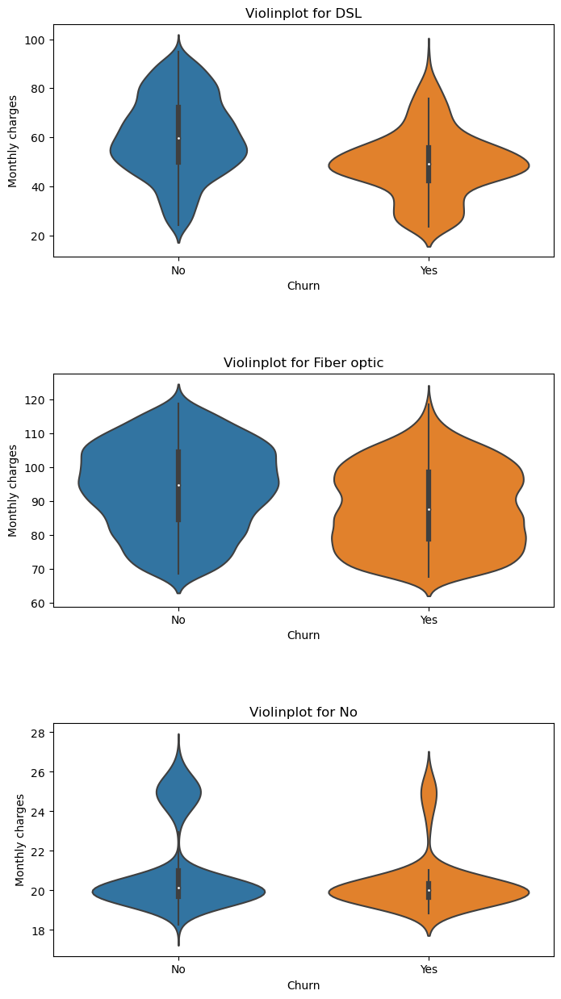

In [43]:
# Select Service categories 
Internet_Service = telco_df['InternetService'].unique()

# Set up subplots for box plots
fig, axes = plt.subplots(nrows=len(Internet_Service), figsize=(8, 15))
fig.subplots_adjust(hspace=0.5)

# Create box plots for each numerical variable
for col, ax in zip(Internet_Service, axes):
    sns.violinplot(x='Churn', y='MonthlyCharges', data=telco_df[telco_df['InternetService']==col], ax=ax)
    ax.set_title(f'Violinplot for {col}')
    ax.set_xlabel('Churn')
    ax.set_ylabel('Monthly charges')

plt.show()

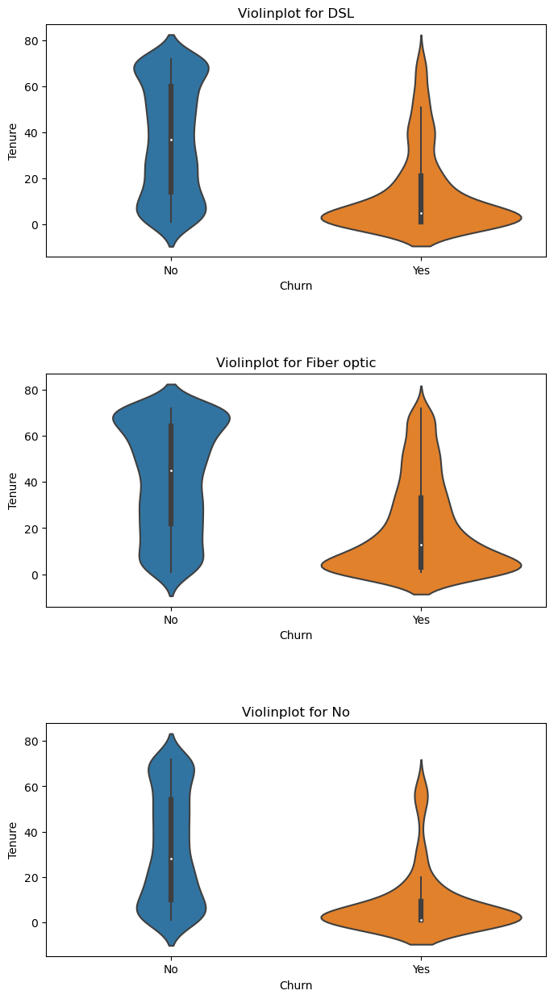

In [44]:
# Select Service categories 
Internet_Service = telco_df['InternetService'].unique()

# Set up subplots for box plots
fig, axes = plt.subplots(nrows=len(Internet_Service), figsize=(8, 15))
fig.subplots_adjust(hspace=0.5)

# Create box plots for each numerical variable
for col, ax in zip(Internet_Service, axes):
    sns.violinplot(x='Churn', y='tenure', data=telco_df[telco_df['InternetService']==col], ax=ax)
    ax.set_title(f'Violinplot for {col}')
    ax.set_xlabel('Churn')
    ax.set_ylabel('Tenure')

plt.show()

In [45]:
# RELATIONSHIPS BETWEEN CATEGORICAL FEATURES

In [46]:
from scipy.stats import chi2_contingency
from itertools import combinations

# Convert Tenure_Category to 'category' data type
telco_df['Tenure_Category'] = telco_df['Tenure_Category'].astype('category')

# Selecting only categorical columns
categorical_columns = telco_df.select_dtypes(include=['category']).columns
telco_categorical = telco_df[categorical_columns].copy()

# Function to calculate Cramér's V
def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

# Set significance level (alpha) and Cramér's V threshold
alpha = 0.05
cramers_v_threshold = 0.4

# Iterate over unique pairs of categorical variables
print("Strong and significant relationship between:")
for col1, col2 in combinations(categorical_columns, 2):
    contingency_table = pd.crosstab(telco_categorical[col1], telco_categorical[col2])
    chi2, p, _, _ = chi2_contingency(contingency_table)
    
    # Convert DataFrame to NumPy array for cramers_v function
    cramersv = cramers_v(contingency_table.to_numpy())
    
    # Check for significance and strength
    if p < alpha and cramersv > cramers_v_threshold:
        print(f"\'{col1}' and '{col2}'")
        # print(f"Chi2 value: {chi2}")
        # print(f"P-value: {p}")
        # print(f"Cramér's V: {cramersv}")

Strong and significant relationship between:
'Partner' and 'Dependents'
'PhoneService' and 'MultipleLines'
'PhoneService' and 'InternetService'
'InternetService' and 'OnlineSecurity'
'InternetService' and 'OnlineBackup'
'InternetService' and 'DeviceProtection'
'InternetService' and 'TechSupport'
'InternetService' and 'StreamingTV'
'InternetService' and 'StreamingMovies'
'OnlineSecurity' and 'OnlineBackup'
'OnlineSecurity' and 'DeviceProtection'
'OnlineSecurity' and 'TechSupport'
'OnlineSecurity' and 'StreamingTV'
'OnlineSecurity' and 'StreamingMovies'
'OnlineBackup' and 'DeviceProtection'
'OnlineBackup' and 'TechSupport'
'OnlineBackup' and 'StreamingTV'
'OnlineBackup' and 'StreamingMovies'
'DeviceProtection' and 'TechSupport'
'DeviceProtection' and 'StreamingTV'
'DeviceProtection' and 'StreamingMovies'
'TechSupport' and 'StreamingTV'
'TechSupport' and 'StreamingMovies'
'StreamingTV' and 'StreamingMovies'
'Contract' and 'Churn'
'Contract' and 'Tenure_Category'


In [47]:
# 3D VISUALISATIONS

In [48]:
import plotly.express as px

# Define colors for each cluster
colors = ['blue', 'yellow']

fig = px.scatter_3d(
    telco_df,
    x='tenure',
    y='MonthlyCharges',
    z='TotalCharges',
    color='Churn',
    color_discrete_sequence=colors,  # Set the colors for clusters
)

fig.update_layout(
    scene=dict(xaxis_title='tenure', yaxis_title='MonthlyCharges', zaxis_title='TotalCharges'),
    coloraxis_colorbar=dict(title='Churn')  # Set the legend title
)

# Hide the color scale legend
fig.update_layout(coloraxis_showscale=False)

fig.show()

In [49]:
# Define colors for each cluster
colors = ['blue', 'yellow']

fig = px.scatter_3d(
    telco_df,
    x='tenure',
    y='MonthlyCharges',
    z='Contract',
    color='Churn',
    color_discrete_sequence=colors,  # Set the colors for clusters
)

fig.update_layout(
    scene=dict(xaxis_title='tenure', yaxis_title='MonthlyCharges', zaxis_title='Contract'),
    coloraxis_colorbar=dict(title='Churn')  # Set the legend title
)

# Hide the color scale legend
fig.update_layout(coloraxis_showscale=False)

fig.show()

In [50]:
# Define colors for each cluster
colors = ['blue', 'yellow']

fig = px.scatter_3d(
    telco_df,
    x='tenure',
    y='MonthlyCharges',
    z='InternetService',
    color='Churn',
    color_discrete_sequence=colors,  # Set the colors for clusters
)

fig.update_layout(
    scene=dict(xaxis_title='tenure', yaxis_title='MonthlyCharges', zaxis_title='InternetService'),
    coloraxis_colorbar=dict(title='Churn')  # Set the legend title
)

# Hide the color scale legend
fig.update_layout(coloraxis_showscale=False)

fig.show()

### Pre-processing for Clustering analysis

In [51]:
# Drop specified columns
columns_to_drop = ['customerID', 'Churn_numeric', 'ServiceCombination', 'Tenure_Category']
telco_df = telco_df.drop(columns=columns_to_drop)

In [52]:
# Create a copy of the DataFrame
df_clustering = telco_df.copy()

# Define a dictionary to map binary features to 1 and 0
gender_mapping = {'Male': 1, 'Female': 0}
binary_mapping = {'Yes': 1, 'No': 0}
multiple_lines_mapping = {'Yes': 1, 'No': 0, 'No phone service': 0}
optional_services_mapping = {'Yes': 1, 'No': 0, 'No internet service': 0}

# List of binary columns
binary_columns = ['Partner', 'Dependents', 'PhoneService', 'PaperlessBilling', 'Churn']

# List of columns with multiple mapping
multiple_lines_columns = ['MultipleLines']
optional_services_columns = ['OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies']

# Apply mapping 
df_clustering[binary_columns] = df_clustering[binary_columns].apply(lambda col: col.map(binary_mapping))

df_clustering['gender'] = df_clustering['gender'].map(gender_mapping)

df_clustering[multiple_lines_columns] = df_clustering[multiple_lines_columns].apply(lambda col: col.map(multiple_lines_mapping))
df_clustering[optional_services_columns] = df_clustering[optional_services_columns].apply(lambda col: col.map(optional_services_mapping))

In [53]:
# Convert to 'int' data type
columns_to_convert = ['gender','SeniorCitizen','Partner','Dependents','PhoneService','MultipleLines',
'OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport','StreamingTV','StreamingMovies','PaperlessBilling','Churn']

df_clustering[columns_to_convert] = df_clustering[columns_to_convert].astype('int64')

# Convert to 'numeric' data type, handling errors by coercing non-numeric values to NaN
numeric_to_convert = 'TotalCharges'
df_clustering[numeric_to_convert] = pd.to_numeric(df_clustering[numeric_to_convert], errors='coerce')

In [54]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Separate features and target variable
X = df_clustering.drop('Churn', axis=1)
y = df_clustering['Churn']

# Define numerical and categorical features
numerical_features = pd.Index(['tenure', 'MonthlyCharges', 'TotalCharges'])
binary_features = pd.Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents','PhoneService', 'MultipleLines', 
                            'OnlineSecurity', 'OnlineBackup','DeviceProtection', 'TechSupport', 'StreamingTV', 
                            'StreamingMovies','PaperlessBilling'])
categorical_features = X.select_dtypes(include=['category']).columns.tolist()

# Create transformers for preprocessing
numerical_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore', drop='first')) 
]) # Droping first category to handle multicollinearity. This has been tested and the algorithm performed bettwe with this approach.

# Create column transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('bin', 'passthrough', binary_features),  # 'passthrough' means no transformation
        ('cat', categorical_transformer, categorical_features)
    ])

X_clustered = preprocessor.fit_transform(X)

### Customer Clustering

Clustering is a machine learning technique that involves grouping similar data points together based on certain characteristics. The goal of clustering is to find patterns within the data, with the idea that items within the same cluster are more similar to each other than to those in other clusters. It is an unsupervised learning approach, meaning that the algorithm does not require labeled training data.

In the context of a customer churn prediction project, clustering can be relevant for several reasons:

- Identifying Customer Segments: Clustering can help identify distinct groups or segments of customers with similar behavior, preferences, or characteristics. Understanding these segments can provide valuable insights into the different types of customers Telco has.

- Feature Engineering: Clustering can be used to create new features for predictive modeling. For example, assigning a cluster label to each customer can serve as an additional feature that captures the inherent patterns within the data.

- Targeted Marketing Strategies: Once customer segments are identified, businesses can tailor their marketing strategies and retention efforts to address the specific needs and preferences of each cluster. This can improve the effectiveness of retention campaigns.

- Risk Assessment: Clustering can help in assessing the risk of churn for different customer segments. Some segments may be more prone to churn than others, and this information can be valuable in prioritizing efforts to retain high-risk customers.

- Model Calibration: By incorporating cluster information into predictive models, the model's accuracy in predicting customer churn may be improved. The distinct characteristics of each cluster can be used to fine-tune model parameters and enhance its predictive power.

- Anomaly Detection: Clustering can help identify outliers or anomalies within the data, which may represent unusual customer behavior. Detecting these anomalies early on can be crucial in predicting and preventing customer churn.

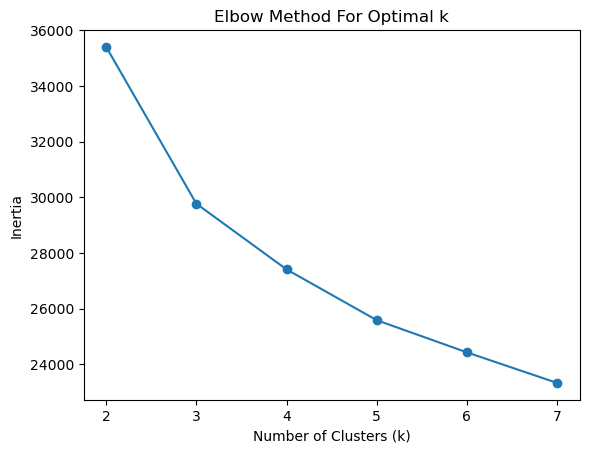

In [55]:
from sklearn.cluster import KMeans

# Create an empty list to store the inertia values
inertia_values = []

# Define a range of k values to try (adjust as needed)
k_values = range(2, 8)

# Iterate through different values of k
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_clustered)
    inertia_values.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(k_values, inertia_values, marker='o')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

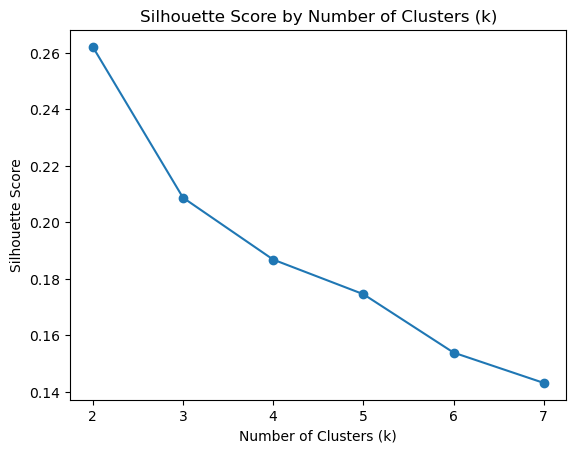

In [56]:
from sklearn.metrics import silhouette_score

# Create an empty list to store the silhouette scores
silhouette_scores = []

# Iterate through different values of k
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(X_clustered)

    # Check if the number of unique labels is greater than 1
    if len(np.unique(cluster_labels)) > 1:
        # Compute the silhouette score
        silhouette_avg = silhouette_score(X_clustered, cluster_labels)
        silhouette_scores.append(silhouette_avg)
    else:
        silhouette_scores.append(None)  # Append None for cases where there's only one cluster

# Plot the silhouette scores by k
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score by Number of Clusters (k)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.show()

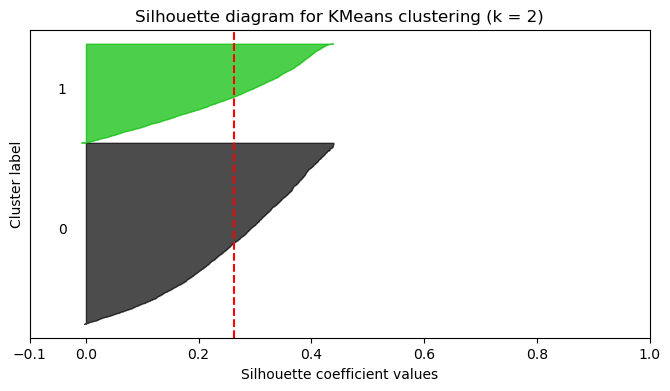

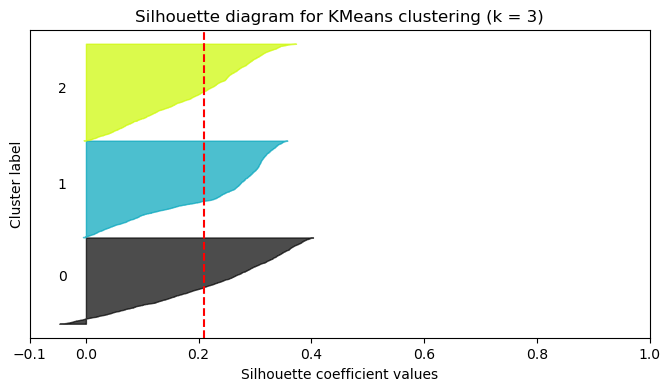

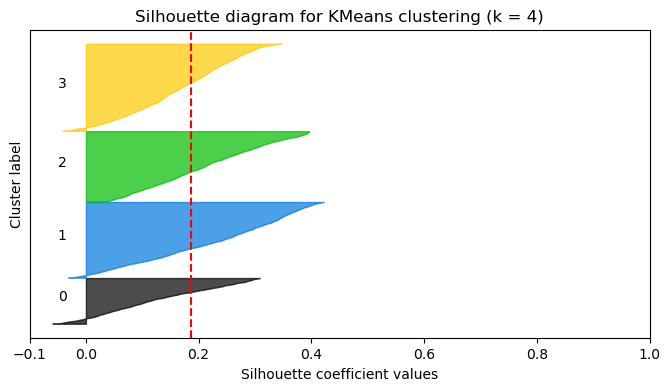

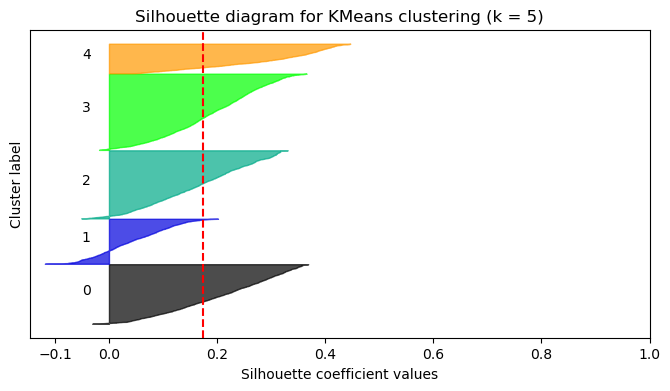

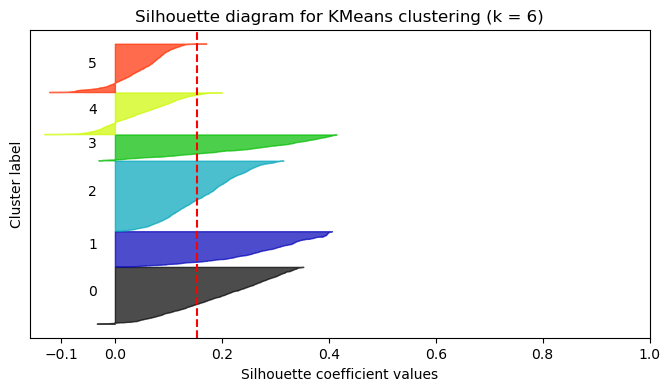

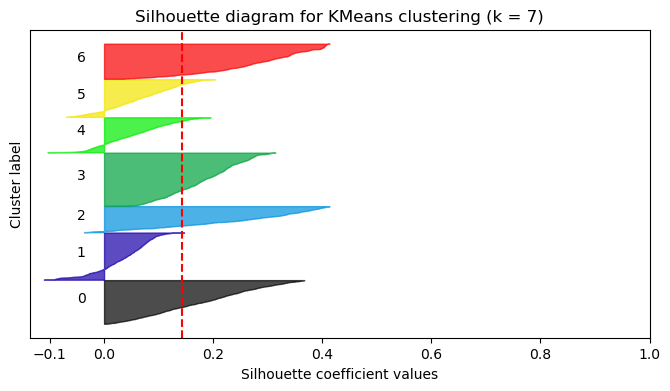

In [57]:
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm

# Iterate through different values of k
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(X_clustered)

    # Check if the number of unique labels is greater than 1
    if len(np.unique(cluster_labels)) > 1:
        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X_clustered, cluster_labels)

        # Create a subplot for the silhouette diagram
        fig, ax = plt.subplots()
        fig.set_size_inches(8, 4)

        y_lower = 10
        for i in range(k):
            # Aggregate the silhouette scores for samples belonging to cluster i
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            # Fill the silhouette diagram
            color = cm.nipy_spectral(float(i) / k)
            ax.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette diagram with cluster numbers at the middle
            ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for the next plot
            y_lower = y_upper + 10

        ax.set_title("Silhouette diagram for KMeans clustering (k = {})".format(k))
        ax.set_xlabel("Silhouette coefficient values")
        ax.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax.axvline(x=np.mean(sample_silhouette_values), color="red", linestyle="--")

        ax.set_yticks([])  # Clear the yaxis labels/ticks
        ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        plt.show()
    else:
        print(f"Skipping k={k} as it results in only one cluster.")

In [58]:
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
labels = kmeans.fit_predict(X_clustered)

In [59]:
# Add cluster labels to the original dataframe
df_clustering['Cluster'] = labels

# Separate data by clusters
cluster_0 = df_clustering[df_clustering['Cluster'] == 0]
cluster_1 = df_clustering[df_clustering['Cluster'] == 1]
cluster_2 = df_clustering[df_clustering['Cluster'] == 2]

# Analyze numerical features for each cluster
numerical_summary = pd.DataFrame({
    'Cluster 0': cluster_0[numerical_features].mean(),
    'Cluster 1': cluster_1[numerical_features].mean(),
    'Cluster 2': cluster_2[numerical_features].mean()
})
print("Numerical Features:")
print(numerical_summary)

# Analyze binary features for each cluster, including 'Churn' as an additional index
binary_features_with_churn = pd.Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService',
       'MultipleLines', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'PaperlessBilling', 'Churn'], dtype='object')

binary_summary = pd.DataFrame({
    'Cluster 0': cluster_0[binary_features_with_churn].mean(),
    'Cluster 1': cluster_1[binary_features_with_churn].mean(),
    'Cluster 2': cluster_2[binary_features_with_churn].mean()
})
print("\nBinary Features:")
print(binary_summary)

categorical_summary = pd.DataFrame()
for feature in categorical_features:
    feature_percentage = df_clustering.groupby(['Cluster', feature]).size().unstack(fill_value=0)
    feature_percentage = feature_percentage.div(feature_percentage.sum(axis=1), axis=0) * 100  # Convert to percentage
    feature_percentage.columns = [f"{col} %" for col in feature_percentage.columns]
    categorical_summary = pd.concat([categorical_summary, feature_percentage], axis=1)

print("\nCategorical Features in Percentage Terms:")
print(categorical_summary)

Numerical Features:
                  Cluster 0   Cluster 1    Cluster 2
tenure            58.831492   26.419687    14.827714
MonthlyCharges    89.347721   29.364209    78.248951
TotalCharges    5253.248066  736.697776  1174.922574

Binary Features:
                  Cluster 0  Cluster 1  Cluster 2
gender             0.498158   0.520181   0.495066
SeniorCitizen      0.200276   0.057249   0.233553
Partner            0.693370   0.443575   0.333059
Dependents         0.347606   0.380560   0.172697
PhoneService       0.928177   0.823723   0.960526
MultipleLines      0.693831   0.162685   0.437911
OnlineSecurity     0.557090   0.121087   0.210115
OnlineBackup       0.685543   0.099671   0.285362
DeviceProtection   0.696593   0.075783   0.296464
TechSupport        0.574125   0.109555   0.216694
StreamingTV        0.715470   0.037479   0.435033
StreamingMovies    0.724217   0.036244   0.439967
PaperlessBilling   0.686464   0.359143   0.742188
Churn              0.145488   0.148270   0.490543


In [60]:
# Analyze categorical features for each cluster
categorical_summary = pd.DataFrame()
for feature in categorical_features:
    feature_count = df_clustering.groupby(['Cluster', feature]).size().unstack(fill_value=0)
    feature_count.columns = [f"{col} count" for col in feature_count.columns]
    categorical_summary = pd.concat([categorical_summary, feature_count], axis=1)

print("\nCategorical Features:")
print(categorical_summary)


Categorical Features:
         DSL count  Fiber optic count  No count  Month-to-month count  \
Cluster                                                                 
0              836               1336         0                   517   
1              908                  0      1520                  1188   
2              672               1760         0                  2170   

         One year count  Two year count  Bank transfer (automatic) count  \
Cluster                                                                    
0                   705             950                              699   
1                   536             704                              488   
2                   231              31                              355   

         Credit card (automatic) count  Electronic check count  \
Cluster                                                          
0                                  697                     607   
1                               

**Cluster 0: Long-term Enthusiasts**
<br>
<br>
Description:Long-term customers with higher spending.
- DSL (38%) or Fiber optic (62%) services.
- Active users of various additional services.
- Engaged in longer-term contracts of 1 or 2 years (76%).
- Prefer automatic payment methods (Bank transfer and Credit card).
- Generally, have a higher probability of being loyal customers.
<br>

Customer Profile:
- Segmentation: Established and loyal customers.
- Behavior: Prefer stable and reliable services with a commitment to longer contracts.
- Potential Strategies: Offer loyalty rewards, promote additional services or upgrades.
<br>

**Cluster 1: Value-Oriented Traditionalists**
<br>
<br>
Description: Customers with moderate tenure and preference for lower-cost options.
- Customers who use only phone services (63%) or DSL (37%).
- Prefer Month-to-month contracts (49%).
- Show a preference for Mailed check payment methods (46%).
- Low likelihood of churning
<br>

Customer Profile:
- Segmentation: Moderate-term customers with basic service needs, particularly phone services.
- Behavior: Prefer flexibility with short-term commitments, cost-conscious.
- Potential Strategies: Offer promotions for extended contracts, upsell additional services for internet usage.
<br>

**Cluster 2: Dynamic Explorers**
<br>
<br>
Description: Customers with short tenure and high likelihood of churning.
- DSL (28%) or Fiber optic (72%) services.
- Less likely to have partners or dependents.
- Prefer Month-to-month contracts (89%).
- Lower use of additional services.
- High likelihood of churning (49% churned last month).
<br>

Customer Profile:
- Segmentation: Short-term tenure and highest level of Fiber optic usage.
- Behavior: Seek high-speed internet but with a tendency to churn.
- Potential Strategies: Focus on customer retention efforts, personalized offers to reduce churn.

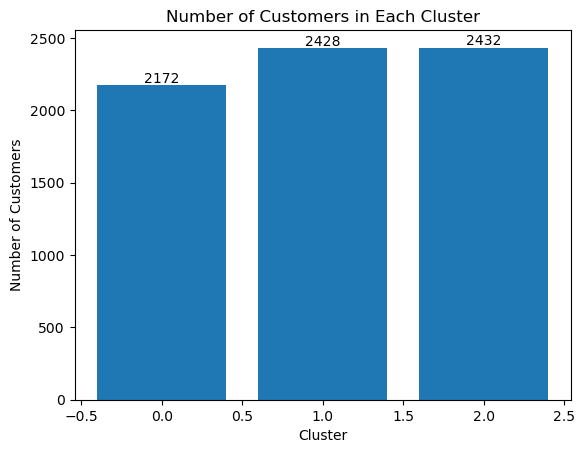

In [61]:
# Count the number of occurrences of each cluster
cluster_counts = df_clustering['Cluster'].value_counts()

# Create a bar chart
plt.bar(cluster_counts.index, cluster_counts.values)

# Add labels and title
plt.xlabel('Cluster')
plt.ylabel('Number of Customers')
plt.title('Number of Customers in Each Cluster')

# Annotate each bar with its value
for i, value in enumerate(cluster_counts.values):
    plt.text(cluster_counts.index[i], value, str(value), ha='center', va='bottom')

# Show the plot
plt.show()

In [62]:
len(df_clustering[df_clustering['Churn']==1])

1869

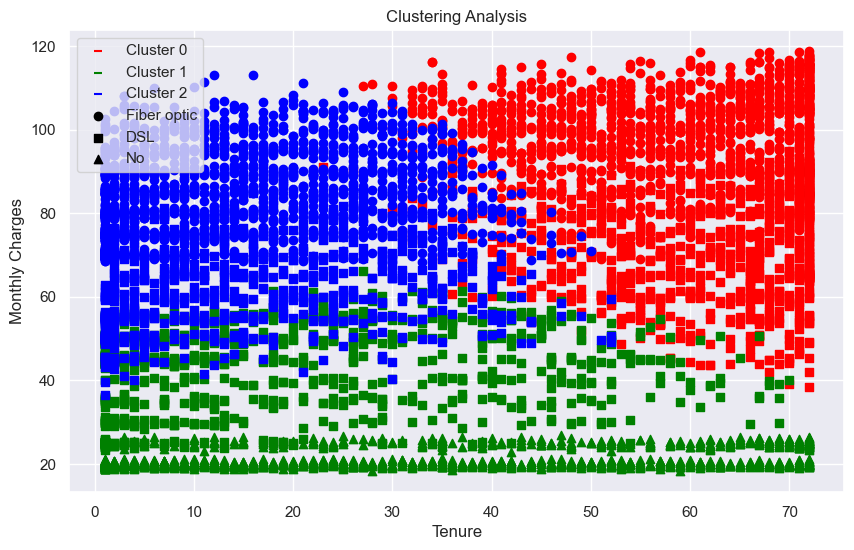

In [63]:
# Set seaborn style for better aesthetics (optional)
sns.set()

# Define the colors for each cluster
cluster_colors = {0: 'red', 1: 'green', 2: 'blue'}  # Update with your actual cluster colors

# Define the shapes for each InternetService category
shapes = {'Fiber optic': 'o', 'DSL': 's', 'No': '^'}  # Update with your actual shapes

# Create a scatter plot
plt.figure(figsize=(10, 6))
for cluster, color in cluster_colors.items():
    for internet_service, shape in shapes.items():
        subset = df_clustering[(df_clustering['Cluster'] == cluster) & (df_clustering['InternetService'] == internet_service)]
        plt.scatter(subset['tenure'], subset['MonthlyCharges'], color=color, marker=shape, label=None)

# Plot dummy points for legend entries
for cluster, color in cluster_colors.items():
    plt.scatter([], [], color=color, label=f'Cluster {cluster}', marker='_')  

for internet_service, shape in shapes.items():
    plt.scatter([], [], color='black', label=f'{internet_service}', marker=shape)

# Customize the plot
plt.title('Clustering Analysis')
plt.xlabel('Tenure')
plt.ylabel('Monthly Charges')
plt.legend()

# Show the plot
plt.show()


In [64]:
import plotly.express as px

# Define colors for each cluster
colors = ['red', 'green', 'blue']

fig = px.scatter_3d(
    df_clustering,
    x='tenure',
    y='MonthlyCharges',
    z='TotalCharges',
    color='Cluster',
    symbol='InternetService',
    color_discrete_sequence=colors,  # Set the colors for clusters
)

fig.update_layout(
    scene=dict(xaxis_title='tenure', yaxis_title='MonthlyCharges', zaxis_title='TotalCharges'),
    coloraxis_colorbar=dict(title='Cluster')  # Set the legend title
)

# Hide the color scale legend
fig.update_layout(coloraxis_showscale=False)

fig.show()

### Pre-processing for Churn Prediction 

In [65]:
# Create a copy of the DataFrame
df_churn = df_clustering.copy()

In [66]:
df_churn['Cluster'] = df_churn['Cluster'].astype('category')

In [67]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Separate features and target variable
X = df_churn.drop('Churn', axis=1)
y = df_churn['Churn']

# Define numerical and categorical features
numerical_features = pd.Index(['tenure', 'MonthlyCharges', 'TotalCharges'])
binary_features = pd.Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents','PhoneService', 'MultipleLines', 
                            'OnlineSecurity', 'OnlineBackup','DeviceProtection', 'TechSupport', 'StreamingTV', 
                            'StreamingMovies','PaperlessBilling'])
categorical_features = X.select_dtypes(include=['category']).columns.tolist()

# Create transformers for preprocessing
numerical_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore', drop=None)) 
])

# Create column transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('bin', 'passthrough', binary_features),  # 'passthrough' means no transformation
        ('cat', categorical_transformer, categorical_features)
    ])

X_churn = preprocessor.fit_transform(X)

# Get feature names after transformation
feature_names_out = preprocessor.get_feature_names_out()
X_churn_df = pd.DataFrame(X_churn, columns=feature_names_out)

### Churn Prediction Modeling

In [68]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_churn, y, test_size=0.2, random_state=42)
print(f"x_train shape: {X_train.shape} | x_test shape: {X_test.shape}")

x_train shape: (5625, 29) | x_test shape: (1407, 29)


In [69]:
from sklearn.model_selection import StratifiedKFold, GridSearchCV, cross_validate, cross_val_score
from sklearn.metrics import classification_report, make_scorer, accuracy_score, recall_score, precision_score, f1_score, roc_auc_score, average_precision_score
from sklearn.exceptions import FitFailedWarning
import warnings
from tabulate import tabulate

In [70]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [71]:
zero_division = 1  # Set it to a non-zero value to avoid warning

scoring_metrics = {
    'accuracy': make_scorer(accuracy_score),
    'recall': make_scorer(recall_score, zero_division=zero_division),
    'f1': make_scorer(f1_score),
    'ROC-AUC': make_scorer(roc_auc_score),
    'PR-AUC': make_scorer(average_precision_score)}

In the context of a churn prediction project where interpretability and model performance are key priorities, three algorithms were chosen based on their unique strengths. 
<br>

**Logistic Regression** was selected for its high interpretability, as it provides clear insights into the impact of each feature on the likelihood of churn. This transparency can be crucial for understanding the driving factors behind customer attrition.
<br>

**Random Forest**, while sacrificing some interpretability compared to Logistic Regression, was chosen for its robustness and ability to handle non-linear relationships in the data. It also provides feature importance scores, aiding in the identification of key predictors. 
<br>

**Gradient Boosting** algorithms, such as XGBoost, strike a balance between interpretability and predictive power. Although not as interpretable as Logistic Regression, they offer strong performance in capturing complex patterns within the data. Feature importance scores and interpretability techniques contribute to understanding the model's decision-making process. 
<br>

All three algorithms are well-suited for handling imbalanced data, providing a comprehensive approach to churn prediction that aligns with the project's dual objectives of interpretability and performance.

### - Logistic Regression

In [72]:
# import the library
from sklearn.linear_model import LogisticRegression

In [73]:
# Define class weights and parameter grid

class_weights_options = [
    {0: 0.65, 1: 0.35},
    {0: 0.55, 1: 0.45},
    {0: 0.5, 1: 0.5},
    {0: 0.45, 1: 0.55},
    {0: 0.35, 1: 0.65}]

parameters ={'C':[0.1,1,5,10],
             'penalty':['l2'],
             'solver':['liblinear', 'lbfgs'],
             'max_iter': [1000],
             'class_weight': class_weights_options}

In [74]:
# Create logistic regression model 

model=LogisticRegression(max_iter=1000, random_state=42)

In [75]:
np.random.seed(0)

best_models = {}  # Dictionary to store the best model for each metric

for metric_name, scorer in scoring_metrics.items():
    grid_search = GridSearchCV(model, parameters, scoring=scorer, cv=cv, error_score='raise', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    
    # Store the best model for each metric
    best_models[metric_name] = grid_search.best_estimator_
    
    print(f"Best hyperparameters for {metric_name}: {grid_search.best_params_}")
    print(f"Best {metric_name} score: {grid_search.best_score_}")

Best hyperparameters for accuracy: {'C': 0.1, 'class_weight': {0: 0.5, 1: 0.5}, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'liblinear'}
Best accuracy score: 0.8069333333333333
Best hyperparameters for recall: {'C': 5, 'class_weight': {0: 0.35, 1: 0.65}, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'liblinear'}
Best recall score: 0.719732441471572
Best hyperparameters for f1: {'C': 0.1, 'class_weight': {0: 0.35, 1: 0.65}, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'liblinear'}
Best f1 score: 0.6361952581859409
Best hyperparameters for ROC-AUC: {'C': 0.1, 'class_weight': {0: 0.35, 1: 0.65}, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'liblinear'}
Best ROC-AUC score: 0.7609724100512605
Best hyperparameters for PR-AUC: {'C': 1, 'class_weight': {0: 0.45, 1: 0.55}, 'max_iter': 1000, 'penalty': 'l2', 'solver': 'lbfgs'}
Best PR-AUC score: 0.48911870162840687


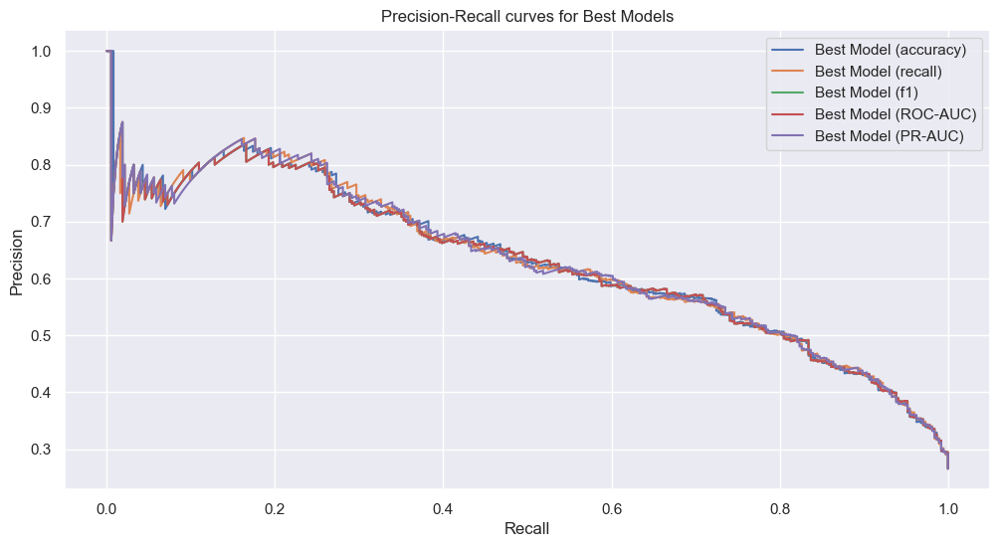

In [76]:
from sklearn.metrics import precision_recall_curve

plt.figure(figsize=(12, 6))

for metric_name, best_model in best_models.items():
    # Calculate precision and recall for the best model of each metric
    y_score_best = best_model.predict_proba(X_test)[:, 1]
    precision_best, recall_best, _ = precision_recall_curve(y_test, y_score_best)

    # Plotting for each metric
    plt.plot(recall_best, precision_best, label=f'Best Model ({metric_name})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall curves for Best Models')
plt.legend()
plt.show()

Model Recall explicitly assigns a higher weight to the minority class. This is crucial for addressing class imbalance, and the 0.65 weight might be more effective in capturing the patterns in the minority class. With 'C': 5, the model applies moderate regularisation, which can help prevent overfitting. It strikes a balance between fitting the training data well and generalising to new, unseen data.

In [77]:
logreg_recall = LogisticRegression(C=5.0, penalty='l2',solver='liblinear', class_weight={0: 0.35, 1: 0.65}, random_state=42, max_iter=1000)
logreg_recall.fit(X_train, y_train)

LogisticRegression(C=5.0, class_weight={0: 0.35, 1: 0.65}, max_iter=1000,
                   random_state=42, solver='liblinear')

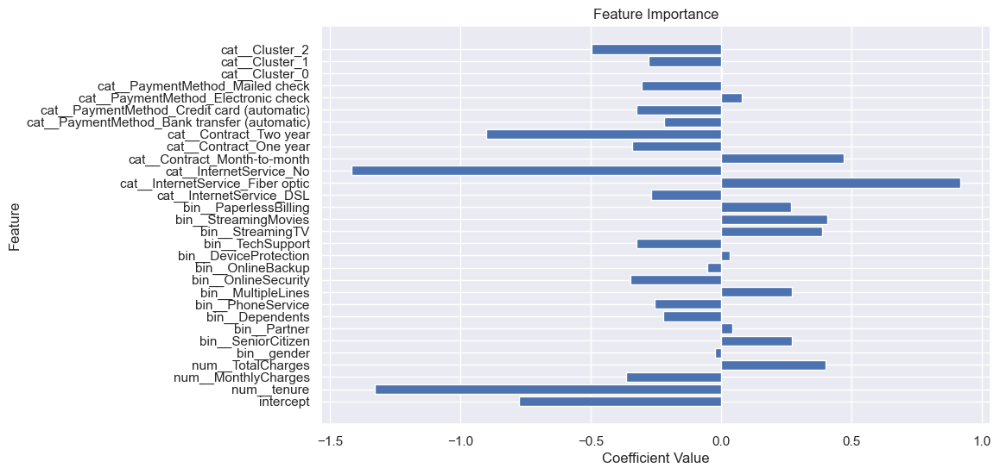

In [78]:
# Add intercept term to feature names and coefficients
feature_names_with_intercept = ['intercept'] + list(feature_names_out)
coefficients = logreg_recall.coef_[0]
coefficients_with_intercept = np.concatenate([[logreg_recall.intercept_[0]], coefficients])

# Plot the feature importance
plt.figure(figsize=(10, 6))
plt.barh(feature_names_with_intercept, coefficients_with_intercept)
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()

In [79]:
# FEATURE SELECTION

In [80]:
from sklearn.metrics import precision_recall_curve, auc
from sklearn.feature_selection import SelectFromModel, RFE

logreg_recall.fit(X_train, y_train)

# Model with all features
y_pred = logreg_recall.predict_proba(X_test)[:, 1]
precision, recall, _ = precision_recall_curve(y_test, y_pred)
auc_all = auc(recall, precision)

# Use SelectFromModel for feature selection
sfm = SelectFromModel(logreg_recall, threshold='median')
sfm.fit(X_train, y_train)
X_train_sfm = sfm.transform(X_train)
X_test_sfm = sfm.transform(X_test)

# Train on the selected features from SelectFromModel
logreg_recall.fit(X_train_sfm, y_train)
y_pred_sfm = logreg_recall.predict_proba(X_test_sfm)[:, 1]
precision_sfm, recall_sfm, _ = precision_recall_curve(y_test, y_pred_sfm)
auc_sfm = auc(recall_sfm, precision_sfm)

# Use Recursive Feature Elimination (RFE) for feature selection
rfe = RFE(estimator=logreg_recall, n_features_to_select=22, step=1)
rfe.fit(X_train, y_train)
X_train_rfe = rfe.transform(X_train)
X_test_rfe = rfe.transform(X_test)

# Train on the selected features from RFE
logreg_recall.fit(X_train_rfe, y_train)
y_pred_rfe = logreg_recall.predict_proba(X_test_rfe)[:, 1]
precision_rfe, recall_rfe, _ = precision_recall_curve(y_test, y_pred_rfe)
auc_rfe = auc(recall_rfe, precision_rfe)

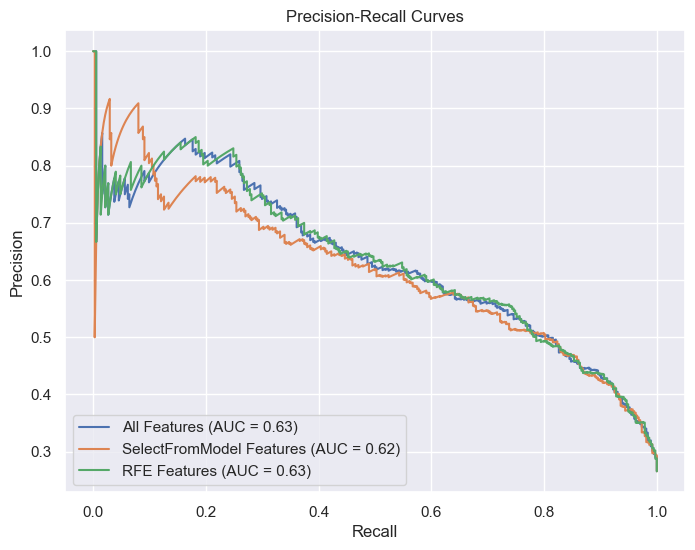

In [81]:
# Plotting Precision-Recall curves
plt.figure(figsize=(8, 6))

plt.plot(recall, precision, label=f'All Features (AUC = {auc_all:.2f})')
plt.plot(recall_sfm, precision_sfm, label=f'SelectFromModel Features (AUC = {auc_sfm:.2f})')
plt.plot(recall_rfe, precision_rfe, label=f'RFE Features (AUC = {auc_rfe:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves')
plt.legend(loc='lower left')
plt.grid(True)
plt.show()

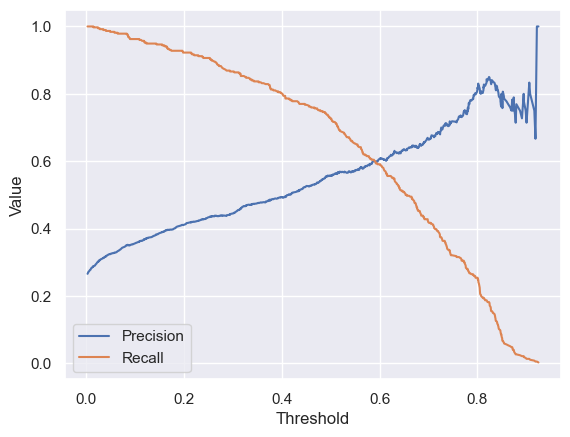

In [82]:
precision_rfe, recall_rfe, thresholds_rfe = precision_recall_curve(y_test, y_pred_rfe)

plt.plot(thresholds_rfe, precision_rfe[:-1], label='Precision')
plt.plot(thresholds_rfe, recall_rfe[:-1], label='Recall')
plt.xlabel('Threshold')
plt.ylabel('Value')
plt.legend()
plt.show()

### - Random Forest

In [83]:
from sklearn.ensemble import RandomForestClassifier

In [84]:
class_weights_options = [
    {0: 0.5, 1: 0.5},
    {0: 0.35, 1: 0.65}]

parameters = {'criterion': ['gini', 'entropy'],
     'n_estimators': [300],
     'max_depth': [2,4,6],
     'min_samples_leaf': [1, 2],
     'min_samples_split': [2, 5],
     'max_features': ['sqrt'],
     'class_weight': class_weights_options}

In [85]:
rf = RandomForestClassifier(random_state=42)

In [86]:
%%script false --no-raise-error # Remove this line to run the cell

# Using %%script false --no-raise-error as a guard in the notebook helps to prevent re-execution of a cell that has already been run and whose results are already saved.

import joblib

np.random.seed(0)

best_models_rf = {}  # Dictionary to store the best model for each metric

for metric_name, scorer in scoring_metrics.items():
    grid_search = GridSearchCV(rf, parameters, scoring=scorer, cv=cv, error_score='raise', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    
    # Store the best model for each metric
    best_models_rf[metric_name] = grid_search.best_estimator_
    
    print(f"Best hyperparameters for {metric_name}: {grid_search.best_params_}")
    print(f"Best {metric_name} score: {grid_search.best_score_}")
    
# Save the best_models_rf dictionary to a file
joblib.dump(best_models_rf, 'best_models_rf.pkl')

Couldn't find program: 'false'


In [87]:
import joblib

# Load the best_models_rf dictionary from the file
loaded_best_models_rf = joblib.load('best_models_rf.pkl')

In [88]:
loaded_best_models_rf

{'accuracy': RandomForestClassifier(class_weight={0: 0.5, 1: 0.5}, max_depth=6,
                        n_estimators=300, random_state=42),
 'recall': RandomForestClassifier(class_weight={0: 0.35, 1: 0.65}, criterion='entropy',
                        max_depth=6, n_estimators=300, random_state=42),
 'f1': RandomForestClassifier(class_weight={0: 0.35, 1: 0.65}, criterion='entropy',
                        max_depth=6, n_estimators=300, random_state=42),
 'ROC-AUC': RandomForestClassifier(class_weight={0: 0.35, 1: 0.65}, criterion='entropy',
                        max_depth=6, n_estimators=300, random_state=42),
 'PR-AUC': RandomForestClassifier(class_weight={0: 0.35, 1: 0.65}, criterion='entropy',
                        max_depth=6, n_estimators=300, random_state=42)}

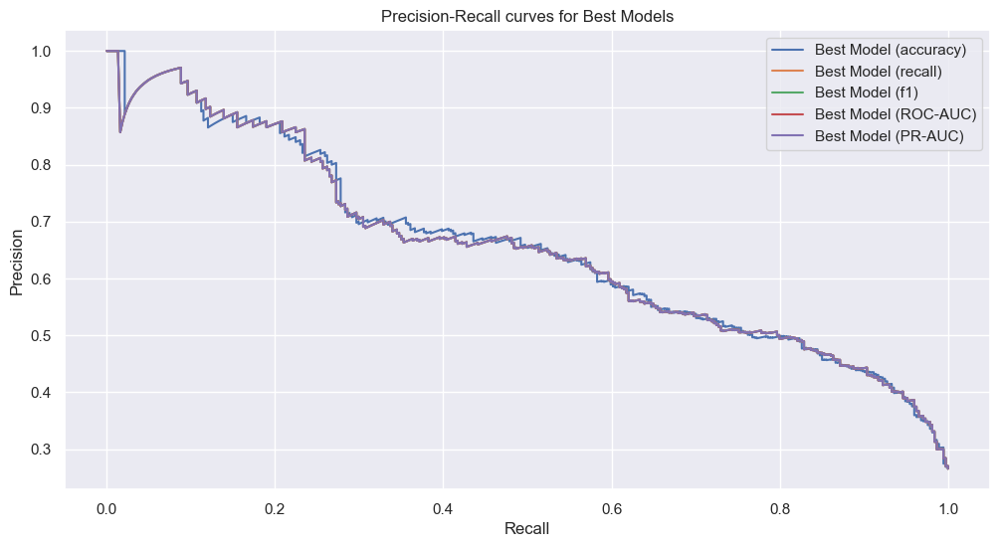

In [89]:
from sklearn.metrics import precision_recall_curve

plt.figure(figsize=(12, 6))

for metric_name, best_model in loaded_best_models_rf.items():
    # Calculate precision and recall for the best model of each metric
    y_score_best = best_model.predict_proba(X_test)[:, 1]
    precision_best, recall_best, _ = precision_recall_curve(y_test, y_score_best)

    # Plotting for each metric
    plt.plot(recall_best, precision_best, label=f'Best Model ({metric_name})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall curves for Best Models')
plt.legend()
plt.show()

Model PR, using average precicion as a score metric, is our preferred option. The class weights are adjusted to give more importance to the positive class, which is beneficial for imbalanced datasets. Gini is chosen as the criterion, which is more computationally efficient than entropy. A maximum depth of 6 is set, which helps prevent overfitting. A minimum of 1 sample per leaf allows the model to capture more detailed patterns without overly restricting the tree nodes.

In [90]:
rf_PR = RandomForestClassifier(criterion='entropy', max_depth=6, max_features='sqrt', min_samples_leaf= 1, min_samples_split= 2, class_weight={0: 0.35, 1: 0.65}, n_estimators= 300, random_state=42)
rf_PR.fit(X_train, y_train)

RandomForestClassifier(class_weight={0: 0.35, 1: 0.65}, criterion='entropy',
                       max_depth=6, n_estimators=300, random_state=42)

In [91]:
# FEATURE SELECTION

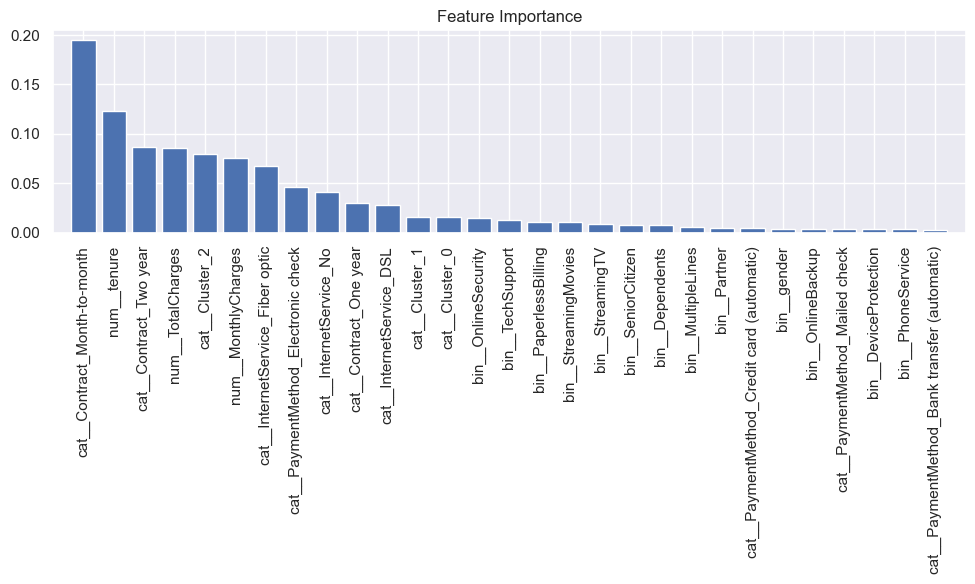

In [92]:
feature_importance = rf_PR.feature_importances_
feature_names = list(feature_names_out)

# Sort feature importances in descending order
indices = np.argsort(feature_importance)[::-1]

plt.figure(figsize=(10, 6))
plt.title("Feature Importance")
plt.bar(range(X_train.shape[1]), feature_importance[indices], align="center")
plt.xticks(range(X_train.shape[1]), [feature_names[i] for i in indices], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.tight_layout()
plt.show()

In [94]:
from sklearn.metrics import precision_recall_curve, auc
from sklearn.feature_selection import SelectFromModel, RFE

rf_PR.fit(X_train, y_train)

# Model with all features
y_pred = rf_PR.predict_proba(X_test)[:, 1]
precision, recall, _ = precision_recall_curve(y_test, y_pred)
auc_all = auc(recall, precision)

# Use SelectFromModel for feature selection
sfm = SelectFromModel(rf_PR, threshold='median')
sfm.fit(X_train, y_train)
X_train_sfm = sfm.transform(X_train)
X_test_sfm = sfm.transform(X_test)

# Train Random Forest on the selected features from SelectFromModel
rf_PR.fit(X_train_sfm, y_train)
y_pred_sfm = rf_PR.predict_proba(X_test_sfm)[:, 1]
precision_sfm, recall_sfm, _ = precision_recall_curve(y_test, y_pred_sfm)
auc_sfm = auc(recall_sfm, precision_sfm)

# Use Recursive Feature Elimination (RFE) for feature selection
rfe = RFE(estimator=rf_PR, n_features_to_select=11, step=1)
rfe.fit(X_train, y_train)
X_train_rfe = rfe.transform(X_train)
X_test_rfe = rfe.transform(X_test)

# Train Random Forest on the selected features from RFE
rf_PR.fit(X_train_rfe, y_train)
y_pred_rfe = rf_PR.predict_proba(X_test_rfe)[:, 1]
precision_rfe, recall_rfe, _ = precision_recall_curve(y_test, y_pred_rfe)
auc_rfe = auc(recall_rfe, precision_rfe)

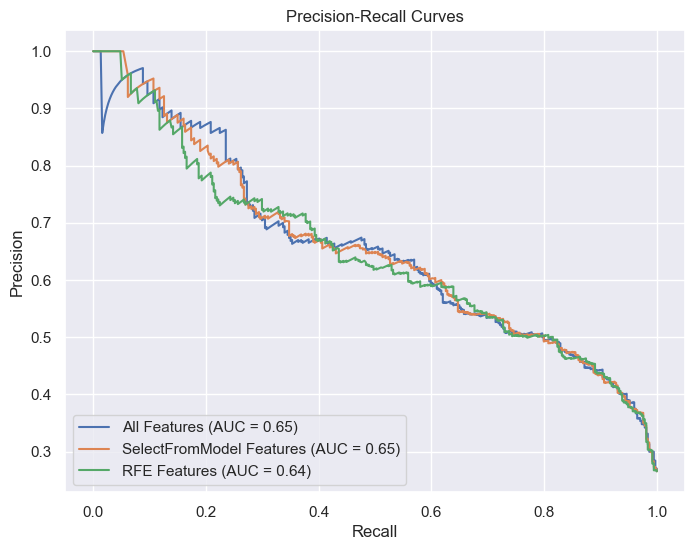

In [95]:
# Plotting Precision-Recall curves
plt.figure(figsize=(8, 6))

plt.plot(recall, precision, label=f'All Features (AUC = {auc_all:.2f})')
plt.plot(recall_sfm, precision_sfm, label=f'SelectFromModel Features (AUC = {auc_sfm:.2f})')
plt.plot(recall_rfe, precision_rfe, label=f'RFE Features (AUC = {auc_rfe:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves')
plt.legend(loc='lower left')
plt.grid(True)
plt.show()

### - Gradient Boosting

In [96]:
import xgboost as xgb

In [97]:
parameters = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.1, 0.01, 0.05],
    'n_estimators': [300],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'gamma': [0, 1, 5]
}

xgb_model = xgb.XGBClassifier(
    objective='binary:logistic',
    scale_pos_weight=2.7,
    random_state=0)

In [98]:
%%script false --no-raise-error # Remove this line to run the cell

# Using %%script false --no-raise-error as a guard in the notebook helps to prevent re-execution of a cell that has already been run and whose results are already saved.

np.random.seed(0)

best_models_xgb = {}  # Dictionary to store the best model for each metric

for metric_name, scorer in scoring_metrics.items():
    grid_search = GridSearchCV(xgb_model, parameters, scoring=scorer, cv=cv, error_score='raise', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    
    # Store the best model for each metric
    best_models_xgb[metric_name] = grid_search.best_estimator_
    
    print(f"Best hyperparameters for {metric_name}: {grid_search.best_params_}")
    print(f"Best {metric_name} score: {grid_search.best_score_}")
    
# Save the best_models_rf dictionary to a file
joblib.dump(best_models_xgb, 'best_models_xgb.pkl')

Couldn't find program: 'false'


In [99]:
# Load the best_models_xgb dictionary from the file
loaded_best_models_xgb = joblib.load('best_models_xgb.pkl')

In [100]:
loaded_best_models_xgb

{'accuracy': XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=0.8, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric=None, feature_types=None,
               gamma=0, grow_policy=None, importance_type=None,
               interaction_constraints=None, learning_rate=0.05, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=7, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               multi_strategy=None, n_estimators=300, n_jobs=None,
               num_parallel_tree=None, random_state=0, ...),
 'recall': XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=1.0, device=None, early_stopping_rounds=None,
               en

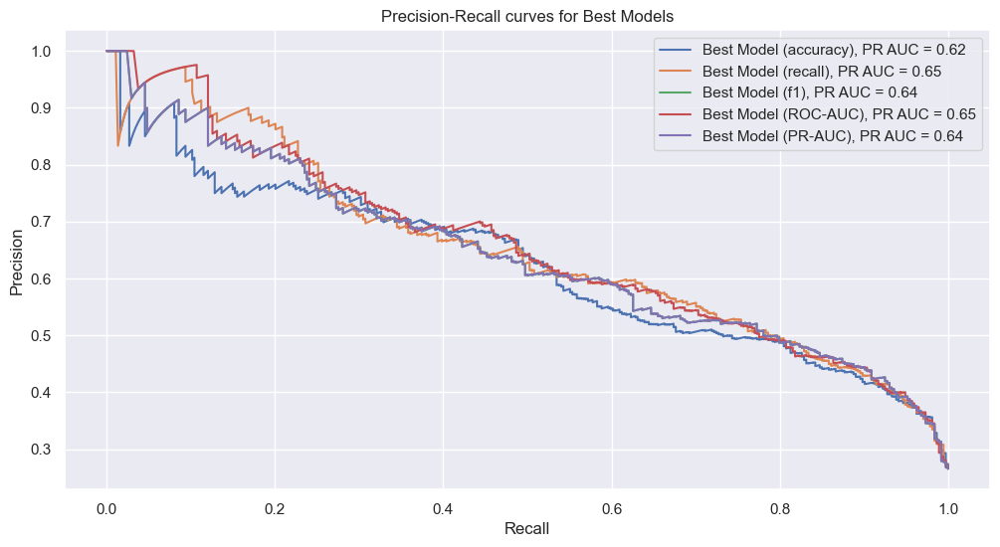

In [101]:
from sklearn.metrics import precision_recall_curve, auc

plt.figure(figsize=(12, 6))

for metric_name, best_model in loaded_best_models_xgb.items():
    # Calculate precision and recall for the best model of each metric
    y_score_best = best_model.predict_proba(X_test)[:, 1]
    precision_best, recall_best, _ = precision_recall_curve(y_test, y_score_best)
    
    # Calculate the area under the precision-recall curve
    pr_auc = auc(recall_best, precision_best)

    # Plotting for each metric, including the PR AUC in the legend
    plt.plot(recall_best, precision_best, label=f'Best Model ({metric_name}), PR AUC = {pr_auc:.2f}')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall curves for Best Models')
plt.legend()
plt.show()

Model ROC_AUC is likely to have a good trade-off between bias and variance, helping it generalize well to new data.

In [102]:
xgb_ROC = xgb.XGBClassifier(colsample_bytree=1, gamma=1, learning_rate=0.1, max_depth= 3, n_estimators= 300, subsample=1, random_state=42)
xgb_ROC.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
              device=None, early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=1, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=300,
              n_jobs=None, num_parallel_tree=None, random_state=42, ...)

In [103]:
# FEATURE SELECTION

In [104]:
df_clustering.columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges', 'Churn', 'Cluster'],
      dtype='object')

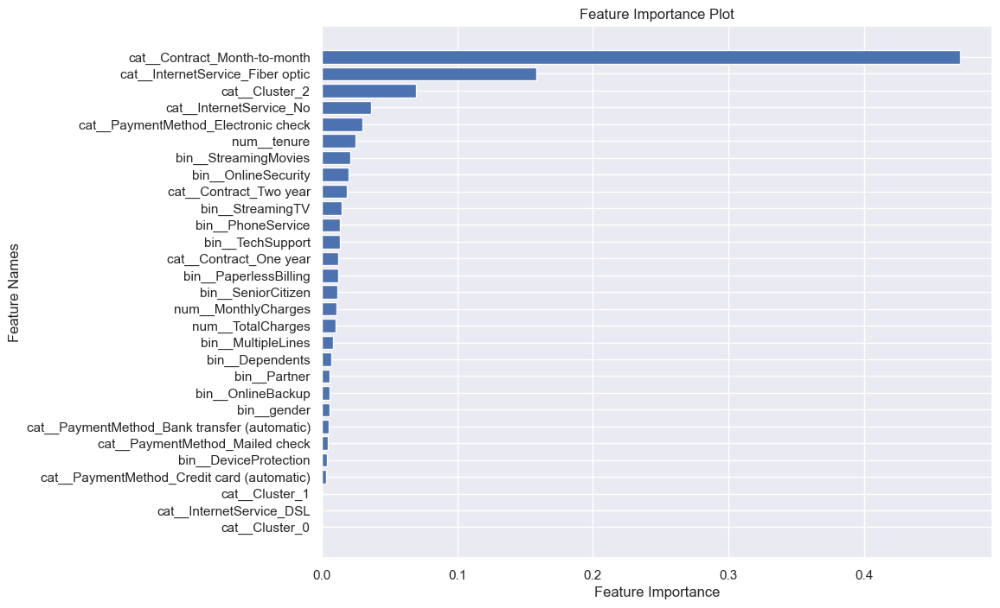

In [105]:
# Get feature importance values from the trained XGBoost model
importance = xgb_ROC.feature_importances_

# Create a DataFrame to store feature names and their importance
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importance})

# Sort the features by importance values (highest to lowest)
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=True)

# Plotting feature importance
plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Feature Importance')
plt.ylabel('Feature Names')
plt.title('Feature Importance Plot')
plt.show()

In [106]:
df_clustering.groupby(['Contract','InternetService', 'Cluster'])[['MonthlyCharges','Churn']].mean()

MonthlyCharges     Churn
Contract       InternetService Cluster                          
Month-to-month DSL             0             63.398333  0.133333
                               1             42.218072  0.352410
                               2             59.282064  0.304609
               Fiber optic     0             96.558972  0.343545
                               1                   NaN       NaN
                               2             84.412717  0.601436
               No              0                   NaN       NaN
                               1             20.409542  0.188931
                               2                   NaN       NaN
One year       DSL             0             68.799798  0.088710
                               1             46.404046  0.069364
                               2             66.482550  0.127517
               Fiber optic     0            100.324179  0.192560
                               1                   NaN       NaN
                               2             90.170732  0.195122
               No              0                   NaN       NaN
                               1             20.822590  0.024793
                               2                   NaN       NaN
Two year       DSL             0             73.902367  0.020833
                               1             45.065493  0.014085
                               2             71.081250  0.000000
               Fiber optic     0            104.741588  0.071090
                               1                   NaN       NaN
                               2             94.314286  0.142857
               No              0                   NaN       NaN
                               1             21.773697  0.007899
                               2                   NaN       NaN

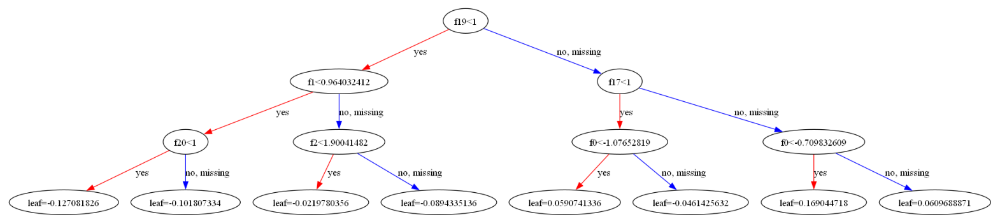

In [107]:
# Plotting the XGBoost tree
xgb.plot_tree(xgb_ROC, num_trees=1, feature_names= feature_names)
fig = plt.gcf()  # Get the current figure

# Adjust figure size
fig.set_size_inches(20, 10)
plt.show()

In [108]:
from sklearn.metrics import precision_recall_curve, auc
from sklearn.feature_selection import SelectFromModel, RFE

xgb_ROC.fit(X_train, y_train)

# Model with all features
y_pred = xgb_ROC.predict_proba(X_test)[:, 1]
precision, recall, _ = precision_recall_curve(y_test, y_pred)
auc_all = auc(recall, precision)

# Use SelectFromModel for feature selection
sfm = SelectFromModel(xgb_ROC, threshold='median')
sfm.fit(X_train, y_train)
X_train_sfm = sfm.transform(X_train)
X_test_sfm = sfm.transform(X_test)

# Train Gradient Boosting on the selected features from SelectFromModel
xgb_ROC.fit(X_train_sfm, y_train)
y_pred_sfm = xgb_ROC.predict_proba(X_test_sfm)[:, 1]
precision_sfm, recall_sfm, _ = precision_recall_curve(y_test, y_pred_sfm)
auc_sfm = auc(recall_sfm, precision_sfm)

# Use Recursive Feature Elimination (RFE) for feature selection
rfe = RFE(estimator=xgb_ROC, n_features_to_select=17, step=1)
rfe.fit(X_train, y_train)
X_train_rfe = rfe.transform(X_train)
X_test_rfe = rfe.transform(X_test)

# Train Gradient Boosting on the selected features from RFE
xgb_ROC.fit(X_train_rfe, y_train)
y_pred_rfe = xgb_ROC.predict_proba(X_test_rfe)[:, 1]
precision_rfe, recall_rfe, _ = precision_recall_curve(y_test, y_pred_rfe)
auc_rfe = auc(recall_rfe, precision_rfe)

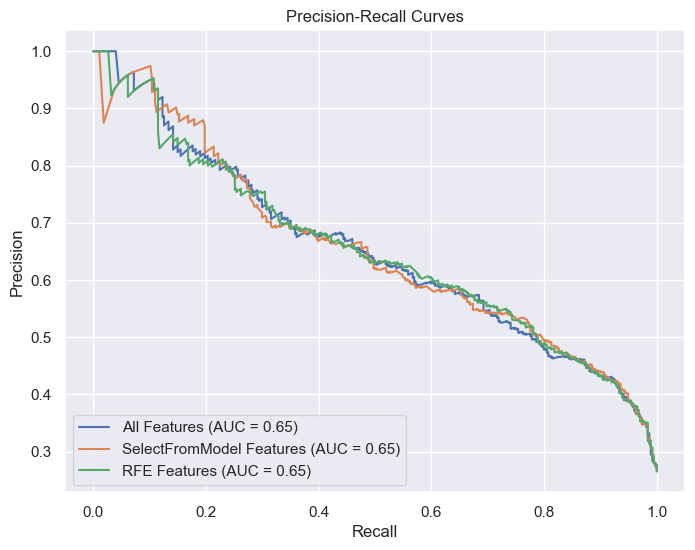

In [109]:
# Plotting Precision-Recall curves
plt.figure(figsize=(8, 6))

plt.plot(recall, precision, label=f'All Features (AUC = {auc_all:.2f})')
plt.plot(recall_sfm, precision_sfm, label=f'SelectFromModel Features (AUC = {auc_sfm:.2f})')
plt.plot(recall_rfe, precision_rfe, label=f'RFE Features (AUC = {auc_rfe:.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves')
plt.legend(loc='lower left')
plt.grid(True)
plt.show()

### Statistical Evaluation

The primary goal in churn prediction is to identify customers who are actually at risk of churning. Maximising recall ensures that you capture as many true positives (actual churners) as possible. This is crucial for implementing effective retention strategies and preventing customer attrition.

While recall is important, precision should not be completely ignored. Precision is crucial for resource efficiency. In a telecommunications context, a false positive may lead to unnecessary and potentially costly retention efforts. Furthermore, incorrectly targeting non-churning customers as potential churners can lead to customer frustration and dissatisfaction.

Maximising recall is important for capturing as many true churners as possible but a balance between precision and recall needs to be considered to ensure a well-rounded and effective churn prediction model.

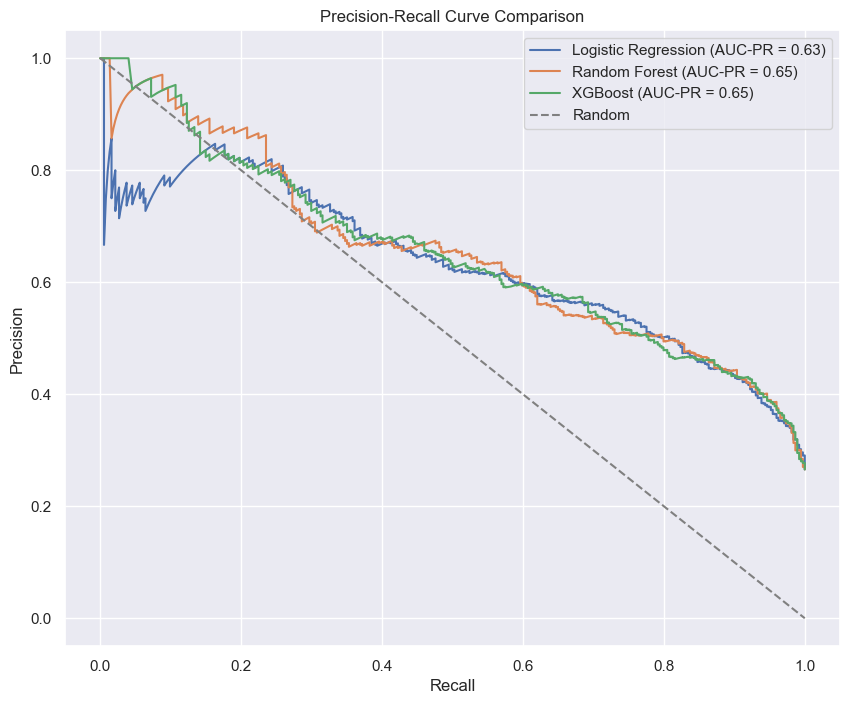

In [110]:
plt.figure(figsize=(10, 8))

logreg_recall.fit(X_train, y_train)
rf_PR.fit(X_train, y_train)
xgb_ROC.fit(X_train, y_train)

y_scores_logreg = logreg_recall.predict_proba(X_test)[:, 1]
y_scores_rf = rf_PR.predict_proba(X_test)[:, 1]
y_scores_xgb = xgb_ROC.predict_proba(X_test)[:, 1]

models = ['Logistic Regression', 'Random Forest', 'XGBoost']

for model_name, y_score in zip(models, [y_scores_logreg, y_scores_rf, y_scores_xgb]):
    precision, recall, _ = precision_recall_curve(y_test, y_score)
    auc_pr = auc(recall, precision)
    plt.plot(recall, precision, label=f'{model_name} (AUC-PR = {auc_pr:.2f})')
    
# Add a diagonal dashed line
plt.plot([0, 1], [1, 0], '--', color='grey', label='Random')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve Comparison')
plt.legend()
plt.show()

### Financial Evaluation

In [111]:
# Estimating budget for retention campaign 
# Assuming marketing budget of 15% of total revenue, with 15% of it dedicated to customer retention efforts
print(df_clustering[df_clustering['Churn']==0]['MonthlyCharges'].sum()*12*0.15*0.15)

85463.1405


The performance of different marketing strategies and retention campaigns can be evaluated considering multiple scenarios and assumptions. This can be done easily by only changing the retention cost, customer lifestime and retention conversion rate inputs below.

In [112]:
from sklearn.metrics import recall_score

# Define the desired recall rates
target_recalls = [0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1]  # You can add more recall values as needed

# Define cost associated with retaining a customer (for both true and false positive)
retention_cost = 0.1

# Define lifetime of a customer, used to calculate the total potential revenue
customer_lifetime = 24

# Define retention conversion rates for true positives and true negatives to calculate missed revenue
retention_probabilities = {0: 0.35, 1: 0.35, 2: 0.35}

The following code calculates various financial metrics such as estimated revenue from true positives, retention costs for both true and false positives and missed revenue from false negatives. This allows us to calculate the Net Income and ROI at different recall rates.

It is important to highligh that these are estimations based on the predictions made in the data used for testing purposes, which wasn't used to train the models.  

In [113]:
def evaluate_model(y_test, y_proba, target_recalls, retention_cost, customer_lifetime, retention_probabilities, df_churn):
    # Initialize lists to store results
    data = []

    for target_recall in target_recalls:
        # Choose a threshold that gives you the desired recall rate
        threshold = 0.9  # Initialize with a default threshold
        while recall_score(y_test, y_proba > threshold) < target_recall:
            threshold -= 0.01

        # Apply the chosen threshold to the predicted probabilities
        y_pred = (y_proba > threshold).astype(int)

        # Evaluate the model with the adjusted threshold
        adjusted_recall = recall_score(y_test, y_pred)

        # Create a new DataFrame for the test set with predictions
        df_model = df_churn.loc[y_test.index].copy()  # Use the indices of y_test
        df_model['Churn_Predicted'] = y_pred

        # Calculate Net Income
        
        # Identify true and false positives
        true_positives = df_model[(df_model['Churn'] == 1) & (df_model['Churn_Predicted'] == 1)]
        false_negatives = df_model[(df_model['Churn'] == 1) & (df_model['Churn_Predicted'] == 0)]
        # Retrieve the cluster for each 
        true_positives_clusters = true_positives['Cluster']
        false_negatives_clusters = false_negatives['Cluster']

        # Adjust the retention rate based on the cluster
        true_positives['Retention_Rate'] = true_positives_clusters.map(retention_probabilities)
        false_negatives['Retention_Rate'] = false_negatives_clusters.map(retention_probabilities)
        # Convert 'Retention_Rate' to numeric before multiplication
        true_positives['Retention_Rate'] = pd.to_numeric(true_positives['Retention_Rate'])
        false_negatives['Retention_Rate'] = pd.to_numeric(false_negatives['Retention_Rate'])

        # Revenues and costs from true positives
        estimated_revenue_tp = (true_positives['MonthlyCharges'] * customer_lifetime * true_positives['Retention_Rate']).sum()
        retention_costs_tp = estimated_revenue_tp * retention_cost
        
        # Cost of False Positives
        false_positives = df_model[(df_model['Churn'] == 0) & (df_model['Churn_Predicted'] == 1)]
        retention_costs_fp = (false_positives['MonthlyCharges'] * customer_lifetime * retention_cost).sum()
        
        # Revenue lost of False Negatives
        missed_revenue_fn = (false_negatives['MonthlyCharges'] * customer_lifetime * 
                             false_negatives['Retention_Rate'] * (1-retention_cost)).sum()

        retention_costs = retention_costs_tp + retention_costs_fp
        net_income = estimated_revenue_tp - retention_costs 
        adjusted_net_income = estimated_revenue_tp - retention_costs - missed_revenue_fn
        
        if retention_costs != 0:
            ROI = (net_income / retention_costs) * 100
            adjusted_ROI = (adjusted_net_income / retention_costs) * 100
        else:
            ROI = 0
            adjusted_ROI = 0
        
        # Store results in a dictionary
        result_dict = {
            'Target_Recall': target_recall,
            'Adjusted_Recall': adjusted_recall,
            'Revenue': estimated_revenue_tp,
            'Retention_Costs': retention_costs,
            'Missed_Revenue': missed_revenue_fn,
            'Net_Income': net_income,
            'Adjusted_Net_Income': adjusted_net_income,
            'ROI (%)': ROI,
            'Adjusted_ROI (%)': adjusted_ROI
        } 

        # Append the dictionary to the data list
        data.append(result_dict)

    # Convert the list of dictionaries to a DataFrame
    result_df = pd.DataFrame(data)

    # Print the DataFrame

    return result_df

In [114]:
# Set the mode.chained_assignment option to 'none'
pd.options.mode.chained_assignment = None  # default='warn'

logreg_recall.fit(X_train, y_train)
y_proba_logreg = logreg_recall.predict_proba(X_test)[:, 1]

logreg_results = evaluate_model(y_test, y_proba_logreg, target_recalls, retention_cost, customer_lifetime, retention_probabilities, df_churn)

In [115]:
# Set the mode.chained_assignment option to 'none'
pd.options.mode.chained_assignment = None  # default='warn'

rf_PR.fit(X_train, y_train)
y_proba_rf = rf_PR.predict_proba(X_test)[:, 1]

rf_results = evaluate_model(y_test, y_proba_rf, target_recalls, retention_cost, customer_lifetime, retention_probabilities, df_churn)

In [116]:
# Set the mode.chained_assignment option to 'none'
pd.options.mode.chained_assignment = None  # default='warn'

xgb_ROC.fit(X_train, y_train)
y_proba_xgb = xgb_ROC.predict_proba(X_test)[:, 1]

xgb_results = evaluate_model(y_test, y_proba_xgb, target_recalls, retention_cost, customer_lifetime, retention_probabilities, df_churn)

The first subplot illustrates the estimated net income and retention costs for each model and target recall rate. A budget line is included in the plot, indicating the financial threshold that the business is willing to spend on retention efforts.


The second subplot visualises the ROI for each model at different target recall rates. This will help us to measure the profitability of the investment, which is the estimated revenue generated for true positives that have been convinced to stay, relative to its cost, which is the retention cost paid for these customers and the false positives. A ROI of 150% means that for every dollar you invested, you got 1.50 USD back.

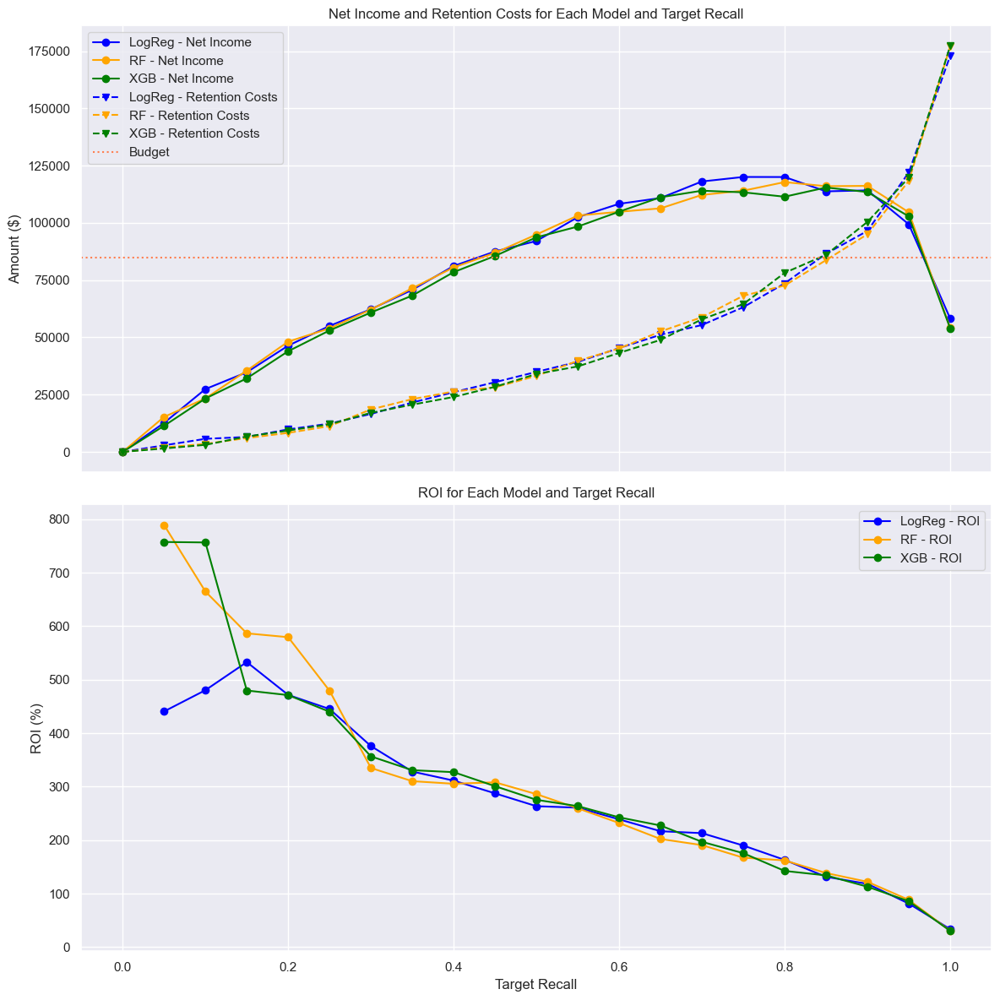

In [117]:
# Data
targets = logreg_results['Target_Recall']

# LogReg data
logreg_results.loc[0, ['Net_Income', 'Retention_Costs', 'ROI (%)']] = 0  # set income and costs of the first row to zero
logreg_results.loc[0, 'ROI (%)'] = np.nan  # set ROI of the first row to nan
net_income_logreg = logreg_results['Net_Income']
retention_costs_logreg = logreg_results['Retention_Costs']
roi_logreg = logreg_results['ROI (%)']

# RF data
rf_results.loc[0, 'ROI (%)'] = np.nan  # set ROI of the first row to nan
net_income_rf = rf_results['Net_Income']
retention_costs_rf = rf_results['Retention_Costs']
roi_rf = rf_results['ROI (%)']

# XGB data
xgb_results.loc[0, 'ROI (%)'] = np.nan  # set ROI of the first row to nan
net_income_xgb = xgb_results['Net_Income']
retention_costs_xgb = xgb_results['Retention_Costs']
roi_xgb = xgb_results['ROI (%)']

# Budget
budget = 85000

# Plot Net Income and Retention Costs
fig, axs = plt.subplots(2, 1, figsize=(12, 12), sharex=True)  # Change 2 to 1 for a single subplot

# Plot Net Income
axs[0].plot(targets, net_income_logreg, color='blue', label='LogReg - Net Income', marker='o')
axs[0].plot(targets, net_income_rf, color='orange', label='RF - Net Income', marker='o')
axs[0].plot(targets, net_income_xgb, color='green', label='XGB - Net Income', marker='o')

# Plot Retention Costs
axs[0].plot(targets, retention_costs_logreg, linestyle='--', color='blue', label='LogReg - Retention Costs', marker='v')
axs[0].plot(targets, retention_costs_rf, linestyle='--', color='orange', label='RF - Retention Costs', marker='v')
axs[0].plot(targets, retention_costs_xgb, linestyle='--', color='green', label='XGB - Retention Costs', marker='v')

# Plot Budget Line
axs[0].axhline(y=budget, color='coral', linestyle=':', label='Budget')

axs[0].set_ylabel('Amount ($)')
axs[0].set_title('Net Income and Retention Costs for Each Model and Target Recall')
axs[0].legend()
axs[0].grid(True)

# Plot ROI
axs[1].plot(targets, roi_logreg, color='blue', label='LogReg - ROI', marker='o')
axs[1].plot(targets, roi_rf, color='orange', label='RF - ROI', marker='o')
axs[1].plot(targets, roi_xgb, color='green', label='XGB - ROI', marker='o')

axs[1].set_xlabel('Target Recall')
axs[1].set_ylabel('ROI (%)')
axs[1].set_title('ROI for Each Model and Target Recall')
axs[1].legend()
axs[1].grid(True)

plt.tight_layout()
plt.show()

The following plot aims to visualise the impact of false negatives on net income for each model. 

This will ensure that decision-makers consider the opportunity cost of not retaining customers and understand the trade-offs between reducing false negatives, lowering missed revenue but increasing reetention costs, and reducing false positives, which would lead to te opposite outcome. The higher the retention conversion rate, the more incentives the business will have to take risks and target more members whereas the opposite is true if the retention conversion rate is assumed to be low.

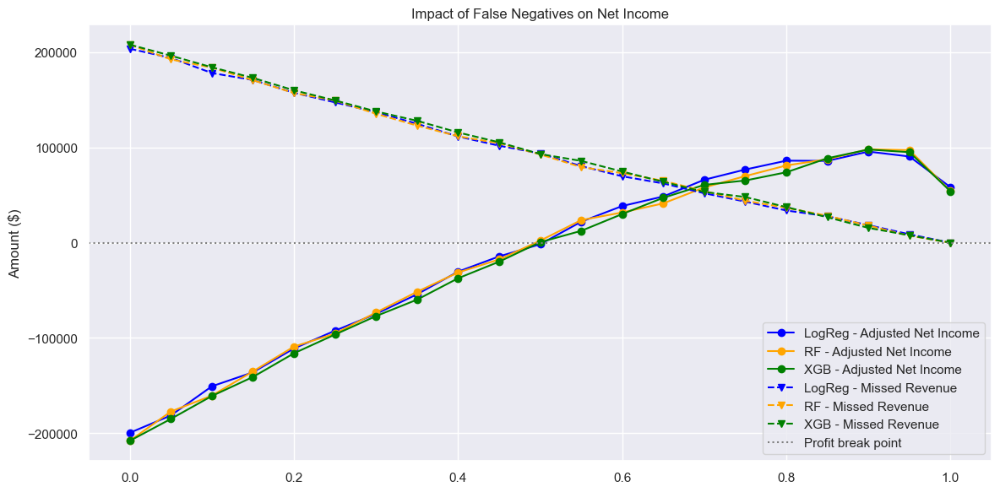

In [118]:
# Data
targets = logreg_results['Target_Recall']

# LogReg data
logreg_results.loc[0, ['Retention_Costs']] = 0  # set income and costs of the first row to zero
logreg_results.loc[0, 'Adjusted_ROI (%)'] = np.nan  # set ROI of the first row to nan
net_income_logreg = logreg_results['Adjusted_Net_Income']
retention_costs_logreg = logreg_results['Retention_Costs']
missed_revenue_logreg = logreg_results['Missed_Revenue']
roi_logreg = logreg_results['Adjusted_ROI (%)']

# RF data
net_income_rf = rf_results['Adjusted_Net_Income']
retention_costs_rf = rf_results['Retention_Costs']
missed_revenue_rf = rf_results['Missed_Revenue']
roi_rf = rf_results['Adjusted_ROI (%)']

# XGB data
net_income_xgb = xgb_results['Adjusted_Net_Income']
retention_costs_xgb = xgb_results['Retention_Costs']
missed_revenue_xgb = xgb_results['Missed_Revenue']
roi_xgb = xgb_results['Adjusted_ROI (%)']

# Profit
profit = 0

# Plot Net Income and Missed Revenue
fig, axs = plt.subplots(1, 1, figsize=(12, 6), sharex=True)

# Plot Net Income
axs.plot(targets, net_income_logreg, color='blue', label='LogReg - Adjusted Net Income', marker='o')
axs.plot(targets, net_income_rf, color='orange', label='RF - Adjusted Net Income', marker='o')
axs.plot(targets, net_income_xgb, color='green', label='XGB - Adjusted Net Income', marker='o')

# Plot Missed Revenue
axs.plot(targets, missed_revenue_logreg, linestyle='--', color='blue', label='LogReg - Missed Revenue', marker='v')
axs.plot(targets, missed_revenue_rf, linestyle='--', color='orange', label='RF - Missed Revenue', marker='v')
axs.plot(targets, missed_revenue_xgb, linestyle='--', color='green', label='XGB - Missed Revenue', marker='v')

# Plot Budget Line
axs.axhline(y=profit, color='grey', linestyle=':', label='Profit break point')

axs.set_ylabel('Amount ($)')
axs.set_title('Impact of False Negatives on Net Income')
axs.legend()
axs.grid(True)

plt.tight_layout()
plt.show()